# Logistic Regression Assignment
## Lead Scoring Case Study

#### Problem Statement:

An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses. 

The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals. Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%. 

Essentially, the company wants to know —

- the company wishes to identify the most potential leads, also known as ‘Hot Leads’.

- ballpark of the target lead conversion rate to be around 80%


Steps that will be followed to approach this problem are:

1. Reading the data
2. Data Cleaning
3. Data Visualization
4. Data Preparation
5. Model Building
6. ROC Curve
7. Model Evaluations
8. Model Predictions on Test data
9. Final Observations

In [3]:
# Importing the Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Importing the Warning to avoid Warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
pd.set_option('display.max_columns', 250)
pd.set_option('display.max_rows', 250)

### Step 1: Importing Data

In [6]:
# Loading Data day.csv
Lead_Scoring_Data = pd.read_csv("Leads.csv")
Lead_Scoring_Data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [7]:
Lead_Scoring_Data.tail()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
9235,19d6451e-fcd6-407c-b83b-48e1af805ea9,579564,Landing Page Submission,Direct Traffic,Yes,No,1,8.0,1845,2.67,Email Marked Spam,Saudi Arabia,IT Projects Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,High in Relevance,No,No,Potential Lead,Mumbai,02.Medium,01.High,15.0,17.0,No,No,Email Marked Spam
9236,82a7005b-7196-4d56-95ce-a79f937a158d,579546,Landing Page Submission,Direct Traffic,No,No,0,2.0,238,2.00,SMS Sent,India,Media and Advertising,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,wrong number given,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,19.0,No,Yes,SMS Sent
9237,aac550fe-a586-452d-8d3c-f1b62c94e02c,579545,Landing Page Submission,Direct Traffic,Yes,No,0,2.0,199,2.00,SMS Sent,India,Business Administration,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,invalid number,Not Sure,No,No,Potential Lead,Mumbai,02.Medium,01.High,13.0,20.0,No,Yes,SMS Sent
9238,5330a7d1-2f2b-4df4-85d6-64ca2f6b95b9,579538,Landing Page Submission,Google,No,No,1,3.0,499,3.00,SMS Sent,India,Human Resource Management,Online Search,NaN,NaN,No,No,No,No,No,No,No,No,NaN,NaN,No,No,NaN,Other Metro Cities,02.Medium,02.Medium,15.0,16.0,No,No,SMS Sent
9239,571b5c8e-a5b2-4d57-8574-f2ffb06fdeff,579533,Landing Page Submission,Direct Traffic,No,No,1,6.0,1279,3.00,SMS Sent,Bangladesh,Supply Chain Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Other Cities,02.Medium,01.High,15.0,18.0,No,Yes,Modified


## Data Exploration

In [9]:
Lead_Scoring_Data.shape

(9240, 37)

In [10]:
Lead_Scoring_Data.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [11]:
Lead_Scoring_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [12]:
Lead_Scoring_Data.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [13]:
# Converting SELECT values to NAN (as they are as good as NULL values)

Lead_Scoring_Data = Lead_Scoring_Data.apply(lambda x: x.str.upper() if x.dtype == "object" else x)  
Lead_Scoring_Data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927B2DF-8BBA-4D29-B9A2-B6E0BEAFE620,660737,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,NaN,SELECT,SELECT,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,LOW IN RELEVANCE,NO,NO,SELECT,SELECT,02.MEDIUM,02.MEDIUM,15.0,15.0,NO,NO,MODIFIED
1,2A272436-5132-4136-86FA-DCC88C88F482,660728,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,SELECT,SELECT,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NaN,NO,NO,SELECT,SELECT,02.MEDIUM,02.MEDIUM,15.0,15.0,NO,NO,EMAIL OPENED
2,8CC8C611-A219-4F35-AD23-FDFD2656BD8A,660727,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,SELECT,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MIGHT BE,NO,NO,POTENTIAL LEAD,MUMBAI,02.MEDIUM,01.HIGH,14.0,20.0,NO,YES,EMAIL OPENED
3,0CC2DF48-7CF4-4E39-9DE9-19797F9B38CC,660719,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,WORD OF MOUTH,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NOT SURE,NO,NO,SELECT,MUMBAI,02.MEDIUM,01.HIGH,13.0,17.0,NO,NO,MODIFIED
4,3256F628-E534-4826-9D63-4A8B88782852,660681,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,SELECT,OTHER,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MIGHT BE,NO,NO,SELECT,MUMBAI,02.MEDIUM,01.HIGH,15.0,18.0,NO,NO,MODIFIED


In [14]:
Lead_Scoring_Data = Lead_Scoring_Data.replace('SELECT',np.nan)
Lead_Scoring_Data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927B2DF-8BBA-4D29-B9A2-B6E0BEAFE620,660737,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,NaN,NaN,NaN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,LOW IN RELEVANCE,NO,NO,NaN,NaN,02.MEDIUM,02.MEDIUM,15.0,15.0,NO,NO,MODIFIED
1,2A272436-5132-4136-86FA-DCC88C88F482,660728,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,NaN,NaN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NaN,NO,NO,NaN,NaN,02.MEDIUM,02.MEDIUM,15.0,15.0,NO,NO,EMAIL OPENED
2,8CC8C611-A219-4F35-AD23-FDFD2656BD8A,660727,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,NaN,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MIGHT BE,NO,NO,POTENTIAL LEAD,MUMBAI,02.MEDIUM,01.HIGH,14.0,20.0,NO,YES,EMAIL OPENED
3,0CC2DF48-7CF4-4E39-9DE9-19797F9B38CC,660719,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,WORD OF MOUTH,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NOT SURE,NO,NO,NaN,MUMBAI,02.MEDIUM,01.HIGH,13.0,17.0,NO,NO,MODIFIED
4,3256F628-E534-4826-9D63-4A8B88782852,660681,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,NaN,OTHER,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MIGHT BE,NO,NO,NaN,MUMBAI,02.MEDIUM,01.HIGH,15.0,18.0,NO,NO,MODIFIED


In [15]:
Lead_Scoring_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

#### Summery of Data Understanding
- Columns : 37 <br>
- Rows : 9240  <br>
- Null Value : Null Value found, Need to handle Null values  <br>
<br>
- Target Variable (y) : "Converted"

In [17]:
# Checking the nULL Values

In [18]:
null_percent = ((Lead_Scoring_Data.isnull().sum())/len(Lead_Scoring_Data))*100
null_percent

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   36.580087
How did you hear about X Education               78.463203
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.0000

In [19]:
# Identifying the Null Values mean percentage and 
# if its more than 40 percent adding it in a list to check and drop the columns if its not required
cut_off = 40
cols_to_drop = list(Lead_Scoring_Data.columns[100*Lead_Scoring_Data.isnull().mean()>cut_off])
print(cols_to_drop)

['How did you hear about X Education', 'Lead Quality', 'Lead Profile', 'Asymmetrique Activity Index', 'Asymmetrique Profile Index', 'Asymmetrique Activity Score', 'Asymmetrique Profile Score']


In [20]:
# Delete the Columns which has 40% or more Null Values
ls_data = Lead_Scoring_Data.drop(cols_to_drop, axis = 1)

In [21]:
# Checking again about the NULL Values
null_percent = ((ls_data.isnull().sum())/len(ls_data))*100
null_percent

Prospect ID                                       0.000000
Lead Number                                       0.000000
Lead Origin                                       0.000000
Lead Source                                       0.389610
Do Not Email                                      0.000000
Do Not Call                                       0.000000
Converted                                         0.000000
TotalVisits                                       1.482684
Total Time Spent on Website                       0.000000
Page Views Per Visit                              1.482684
Last Activity                                     1.114719
Country                                          26.634199
Specialization                                   36.580087
What is your current occupation                  29.112554
What matters most to you in choosing a course    29.318182
Search                                            0.000000
Magazine                                          0.0000

In [22]:
# Now taking cutoff as 30% and reanalyzing the dataset
cut_off = 30
cols_to_drop = list(ls_data.columns[100*ls_data.isnull().mean()>cut_off])
print(cols_to_drop)

['Specialization', 'Tags', 'City']


In [23]:
ls_data.Specialization.value_counts()

Specialization
FINANCE MANAGEMENT                   976
HUMAN RESOURCE MANAGEMENT            848
MARKETING MANAGEMENT                 838
OPERATIONS MANAGEMENT                503
BUSINESS ADMINISTRATION              403
IT PROJECTS MANAGEMENT               366
SUPPLY CHAIN MANAGEMENT              349
BANKING, INVESTMENT AND INSURANCE    338
TRAVEL AND TOURISM                   203
MEDIA AND ADVERTISING                203
INTERNATIONAL BUSINESS               178
HEALTHCARE MANAGEMENT                159
HOSPITALITY MANAGEMENT               114
E-COMMERCE                           112
RETAIL MANAGEMENT                    100
RURAL AND AGRIBUSINESS                73
E-BUSINESS                            57
SERVICES EXCELLENCE                   40
Name: count, dtype: int64

In [24]:
ls_data.Tags.value_counts()

Tags
WILL REVERT AFTER READING THE EMAIL                  2072
RINGING                                              1203
INTERESTED IN OTHER COURSES                           513
ALREADY A STUDENT                                     465
CLOSED BY HORIZZON                                    358
SWITCHED OFF                                          240
BUSY                                                  186
LOST TO EINS                                          175
NOT DOING FURTHER EDUCATION                           145
INTERESTED  IN FULL TIME MBA                          117
GRADUATION IN PROGRESS                                111
INVALID NUMBER                                         83
DIPLOMA HOLDER (NOT ELIGIBLE)                          63
WRONG NUMBER GIVEN                                     47
OPP HANGUP                                             33
NUMBER NOT PROVIDED                                    27
IN TOUCH WITH EINS                                     12
LOST TO O

In [25]:
ls_data.City.value_counts()

City
MUMBAI                         3222
THANE & OUTSKIRTS               752
OTHER CITIES                    686
OTHER CITIES OF MAHARASHTRA     457
OTHER METRO CITIES              380
TIER II CITIES                   74
Name: count, dtype: int64

In [26]:
# From basic understanding we can think that Specialization and City could be useful later, So for now deleting the Tags column only
# ls_data = ls_data.drop('Tags', axis = 1)

In [27]:
ls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 30 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [28]:
# Now taking out the columns which has more than 5% null Values and replace NULL with unknown

In [29]:
categorical_features=[feature for feature in ls_data.columns if ls_data[feature].dtype=="object"]
print(len(categorical_features))
print(categorical_features)

25
['Prospect ID', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses', 'Tags', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'City', 'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview', 'Last Notable Activity']


In [30]:
# now for these columns I will replace the NULL Values with unknown string

for i in categorical_features : 
    ls_data[i] = ls_data[i].fillna('UNKNOWN')

In [31]:
# Checking again about the NULL Values
null_percent = ((ls_data.isnull().sum())/len(ls_data))*100
null_percent

Prospect ID                                      0.000000
Lead Number                                      0.000000
Lead Origin                                      0.000000
Lead Source                                      0.000000
Do Not Email                                     0.000000
Do Not Call                                      0.000000
Converted                                        0.000000
TotalVisits                                      1.482684
Total Time Spent on Website                      0.000000
Page Views Per Visit                             1.482684
Last Activity                                    0.000000
Country                                          0.000000
Specialization                                   0.000000
What is your current occupation                  0.000000
What matters most to you in choosing a course    0.000000
Search                                           0.000000
Magazine                                         0.000000
Newspaper Arti

In [32]:
ls_data.isnull().sum()

Prospect ID                                        0
Lead Number                                        0
Lead Origin                                        0
Lead Source                                        0
Do Not Email                                       0
Do Not Call                                        0
Converted                                          0
TotalVisits                                      137
Total Time Spent on Website                        0
Page Views Per Visit                             137
Last Activity                                      0
Country                                            0
Specialization                                     0
What is your current occupation                    0
What matters most to you in choosing a course      0
Search                                             0
Magazine                                           0
Newspaper Article                                  0
X Education Forums                            

In [33]:
ls_data.shape

(9240, 30)

In [34]:
# Checking the values for each column
for i in ls_data.columns :
    print(ls_data[i].value_counts())
    print("\n")
    print("=====================================================================")
    print("\n")

Prospect ID
7927B2DF-8BBA-4D29-B9A2-B6E0BEAFE620    1
22E9D4EF-D294-4EBF-81C7-7C7A1105AEEA    1
46BEFC49-253A-419B-ABEA-2FD978D2E2B1    1
9D35A2C2-09D8-439F-9875-0E8BBF267F5A    1
F0DE9371-4DC2-48C2-9785-A08D6FC4FCB5    1
                                       ..
FF1F7582-CB7B-4B94-9CDC-3D0D0AFDD9A3    1
644099A2-3DA4-4D23-9546-7676340A372B    1
2A093175-415B-4321-9E69-ED8D9DF65A3C    1
C66249A3-8500-4C66-A511-312D914573DE    1
571B5C8E-A5B2-4D57-8574-F2FFB06FDEFF    1
Name: count, Length: 9240, dtype: int64




Lead Number
660737    1
603303    1
602561    1
602557    1
602540    1
         ..
630422    1
630405    1
630403    1
630390    1
579533    1
Name: count, Length: 9240, dtype: int64




Lead Origin
LANDING PAGE SUBMISSION    4886
API                        3580
LEAD ADD FORM               718
LEAD IMPORT                  55
QUICK ADD FORM                1
Name: count, dtype: int64




Lead Source
GOOGLE               2873
DIRECT TRAFFIC       2543
OLARK CHAT           1755
OR

In [35]:
ls_data.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820
std,23405.995698,0.486714,4.854853,548.021466,2.161418
min,579533.000000,0.000000,0.000000,0.000000,0.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000


In [36]:
# We will replace the missing values of this column with the mode as the % of missing values is less
ls_data['TotalVisits'].fillna(ls_data['TotalVisits'].mean(), inplace=True)
ls_data['Page Views Per Visit'].fillna(ls_data['Page Views Per Visit'].mean(), inplace=True)

In [37]:
ls_data.shape

(9240, 30)

In [38]:
ls_data.isnull().sum()

Prospect ID                                      0
Lead Number                                      0
Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Do Not Call                                      0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Last Activity                                    0
Country                                          0
Specialization                                   0
What is your current occupation                  0
What matters most to you in choosing a course    0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums                               0
Newspaper                      

In [39]:
ls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 30 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9240 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9240 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9240 

In [40]:
ls_data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927B2DF-8BBA-4D29-B9A2-B6E0BEAFE620,660737,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,NO,NO,UNKNOWN,NO,NO,MODIFIED
1,2A272436-5132-4136-86FA-DCC88C88F482,660728,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NO,NO,UNKNOWN,NO,NO,EMAIL OPENED
2,8CC8C611-A219-4F35-AD23-FDFD2656BD8A,660727,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,NO,NO,MUMBAI,NO,YES,EMAIL OPENED
3,0CC2DF48-7CF4-4E39-9DE9-19797F9B38CC,660719,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,RINGING,NO,NO,MUMBAI,NO,NO,MODIFIED
4,3256F628-E534-4826-9D63-4A8B88782852,660681,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,NO,NO,MUMBAI,NO,NO,MODIFIED


In [41]:
# Now Checking if there is any column exists with only one unique value 
ls_data.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        42
Total Time Spent on Website                      1731
Page Views Per Visit                              115
Last Activity                                      18
Country                                            38
Specialization                                     19
What is your current occupation                     7
What matters most to you in choosing a course       4
Search                                              2
Magazine                                            1
Newspaper Article                                   2
X Education Forums          

In [42]:
# since having only 1 unique value in a column won't be significant in our analysis, so dropping those columns as well

cols_to_drop = ['Magazine' , 'Receive More Updates About Our Courses' ,'Update me on Supply Chain Content' ,
                'Get updates on DM Content', 'I agree to pay the amount through cheque' 
                ]
ls_data = ls_data.drop(cols_to_drop, axis = 1)

In [43]:
ls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 25 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9240 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9240 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9240 

In [44]:
ls_data.isnull().sum()

Prospect ID                                      0
Lead Number                                      0
Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Do Not Call                                      0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Last Activity                                    0
Country                                          0
Specialization                                   0
What is your current occupation                  0
What matters most to you in choosing a course    0
Search                                           0
Newspaper Article                                0
X Education Forums                               0
Newspaper                                        0
Digital Advertisement          

In [45]:
ls_data.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        42
Total Time Spent on Website                      1731
Page Views Per Visit                              115
Last Activity                                      18
Country                                            38
Specialization                                     19
What is your current occupation                     7
What matters most to you in choosing a course       4
Search                                              2
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                   

In [46]:
ls_data['Do Not Email'].value_counts()

Do Not Email
NO     8506
YES     734
Name: count, dtype: int64

In [47]:
# Checking the values for each column
for i in ls_data.columns :
    print(ls_data[i].value_counts())
    print("\n")
    print("=====================================================================")
    print("\n")

Prospect ID
7927B2DF-8BBA-4D29-B9A2-B6E0BEAFE620    1
22E9D4EF-D294-4EBF-81C7-7C7A1105AEEA    1
46BEFC49-253A-419B-ABEA-2FD978D2E2B1    1
9D35A2C2-09D8-439F-9875-0E8BBF267F5A    1
F0DE9371-4DC2-48C2-9785-A08D6FC4FCB5    1
                                       ..
FF1F7582-CB7B-4B94-9CDC-3D0D0AFDD9A3    1
644099A2-3DA4-4D23-9546-7676340A372B    1
2A093175-415B-4321-9E69-ED8D9DF65A3C    1
C66249A3-8500-4C66-A511-312D914573DE    1
571B5C8E-A5B2-4D57-8574-F2FFB06FDEFF    1
Name: count, Length: 9240, dtype: int64




Lead Number
660737    1
603303    1
602561    1
602557    1
602540    1
         ..
630422    1
630405    1
630403    1
630390    1
579533    1
Name: count, Length: 9240, dtype: int64




Lead Origin
LANDING PAGE SUBMISSION    4886
API                        3580
LEAD ADD FORM               718
LEAD IMPORT                  55
QUICK ADD FORM                1
Name: count, dtype: int64




Lead Source
GOOGLE               2873
DIRECT TRAFFIC       2543
OLARK CHAT           1755
OR

In [48]:
# From above value_count Analysis we got to know that 'Prospect ID' and 'Lead Number' having unique values for each row. 
# So, we can drop these columns to proceed with our analysis

cols_to_drop = ['Prospect ID' , 'Lead Number']
ls_data.drop(cols_to_drop, axis = 1, inplace = True)

In [49]:
ls_data.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,UNKNOWN,NO,MODIFIED
1,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,UNKNOWN,NO,EMAIL OPENED
2,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,YES,EMAIL OPENED
3,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,MUMBAI,NO,MODIFIED
4,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,NO,MODIFIED


In [50]:
ls_data.shape

(9240, 23)

## Data Visualization 

In [52]:
ls_data.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Converted', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations', 'Tags', 'City',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [53]:
ls_data.describe()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000
mean,0.385390,3.445238,487.698268,2.362820
std,0.486714,4.818723,548.021466,2.145333
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,12.000000,1.000000
50%,0.000000,3.000000,248.000000,2.000000
75%,1.000000,5.000000,936.000000,3.000000
max,1.000000,251.000000,2272.000000,55.000000


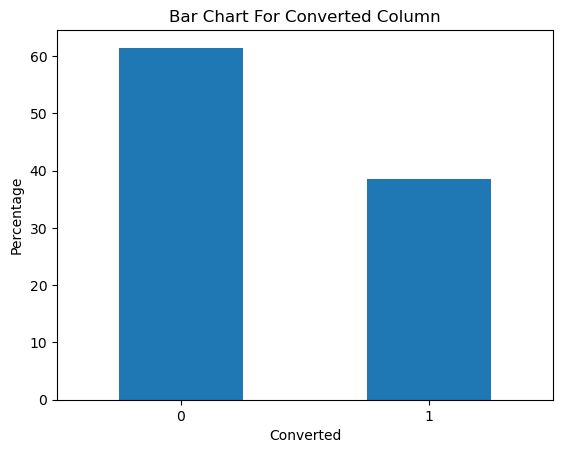

In [54]:
# Checking the dependent variable
((ls_data.Converted.value_counts(normalize = True))*100).plot.bar()
plt.title('Bar Chart For Converted Column')

plt.ylabel ('Percentage')
plt.xticks(rotation = 0)
plt.show()

### Visualizing the Numerical variables

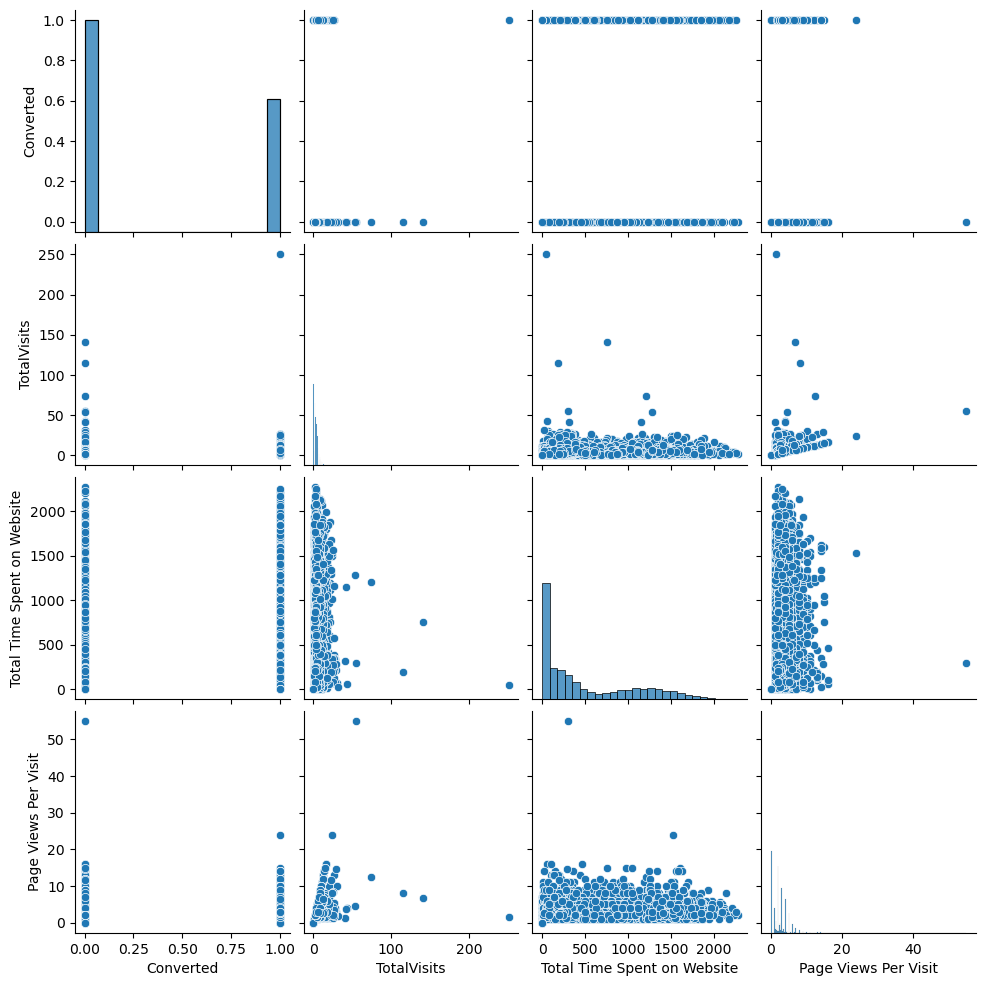

In [56]:
# Plot pairplot to visualize the numerical variable : 

sns.pairplot(ls_data, vars=[ 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit'])
plt.show()

#### Checking for Outliers

In [58]:
# Checking for outliers in the continuous variables
num_ls = ls_data[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']]

In [59]:
# Function for Univariate Analysis on Numerical Variables

def Univariate_Analysis(inp1, out_cols):
    ct = 1
    plt.figure(figsize=(16, 5))
    for col in out_cols:
        print(f"Outlier Analysis for {col}: \n")
        
        
        #Boxplot
        plt.subplot(1, 3, ct)
        sns.boxplot(inp1[col])
        plt.title(f"Boxplot for {col} \n", fontdict={'fontsize': 10, 'fontweight' : 4, 'color' : 'Green'})
        ct+=1

Outlier Analysis for TotalVisits: 

Outlier Analysis for Total Time Spent on Website: 

Outlier Analysis for Page Views Per Visit: 



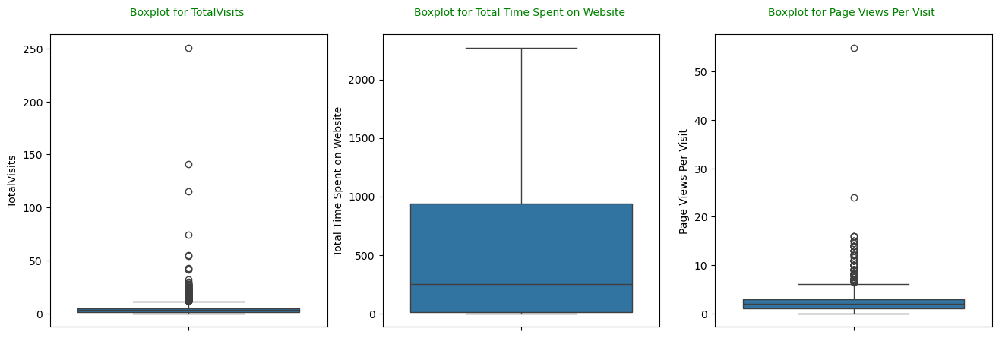

In [60]:
# Perform univariate analysis
# uni_cols = inp1.select_dtypes(include=['number']).columns
out_cols = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']
Univariate_Analysis(ls_data, out_cols)

In [61]:
# Function for Bivariate Analysis on Numerical Variables

def Bivariate_Analysis(inp1, out_cols):
    ct = 1
    plt.figure(figsize=(16, 5))
    for col in out_cols:
        print(f"Outlier Analysis for {col}: \n")
        
        
        #Boxplot
        plt.subplot(1, 3, ct)
        sns.boxplot(y = inp1[col], x = inp1['Converted'], palette= 'Greens')
        plt.title(f"Boxplot for {col} \n", fontdict={'fontsize': 10, 'fontweight' : 4, 'color' : 'Green'})
        ct+=1

Outlier Analysis for TotalVisits: 

Outlier Analysis for Total Time Spent on Website: 

Outlier Analysis for Page Views Per Visit: 



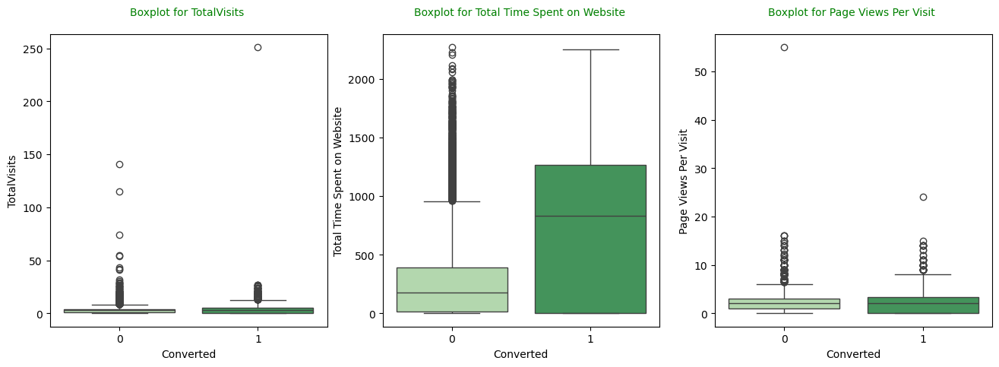

In [62]:
# Perform Bivariate analysis

out_cols = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']
Bivariate_Analysis(ls_data, out_cols)

Inferences :
1. We can see high number of outliers in 'Total Visit' for Converted = 0. Which means customers visiting the website but they are not getting converted. <br>
    i) It could be because of monetory problem. <br>
    ii) It could be because of Unavailability of the course of their choices such as Degree Course instead of only certifications <br>
    ii) Availability of those willing courses in some other platform <br>
2. Median value of the feature 'Total Time Spent on Website' for converted = 1 are considerably higher. This segment can be nurtured more to get more conversions.
3. Also there are many outliers in 'Total Time Spent on Website' column for Converted= 0.

### Removing Outliers

In [65]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
num_ls.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000
mean,3.445238,487.698268,2.362820
std,4.818723,548.021466,2.145333
min,0.000000,0.000000,0.000000
25%,1.000000,12.000000,1.000000
50%,3.000000,248.000000,2.000000
75%,5.000000,936.000000,3.000000
90%,7.000000,1380.000000,5.000000
95%,10.000000,1562.000000,6.000000
99%,17.000000,1840.610000,9.000000


In [66]:
# Outlier treatment
percentile = ls_data['TotalVisits'].quantile([0.95]).values
ls_data['TotalVisits'][ls_data['TotalVisits'] >= percentile[0]] = percentile[0]

percentile = ls_data['Page Views Per Visit'].quantile([0.95]).values
ls_data['Page Views Per Visit'][ls_data['Page Views Per Visit'] >= percentile[0]] = percentile[0]

## As there are no significant outliers in 'Total Time Spent on Website', so we are not treating any.

Outlier Analysis for TotalVisits: 

Outlier Analysis for Total Time Spent on Website: 

Outlier Analysis for Page Views Per Visit: 



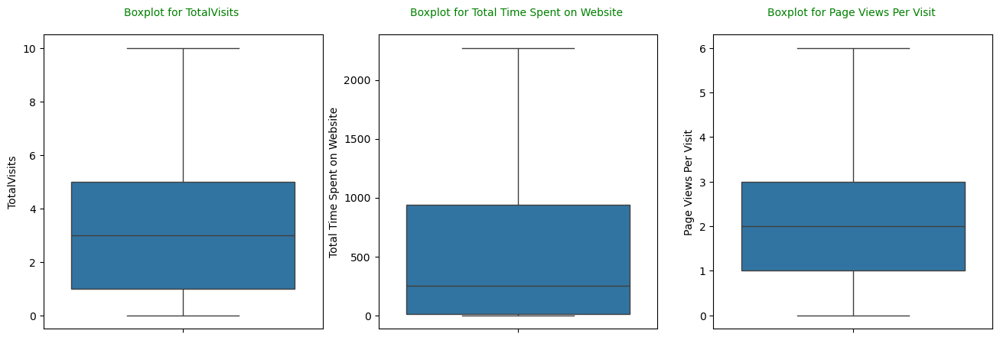

In [67]:
# Verifying the data after performing the Outlier treatment
Univariate_Analysis(ls_data, out_cols)

Outlier Analysis for TotalVisits: 

Outlier Analysis for Total Time Spent on Website: 

Outlier Analysis for Page Views Per Visit: 



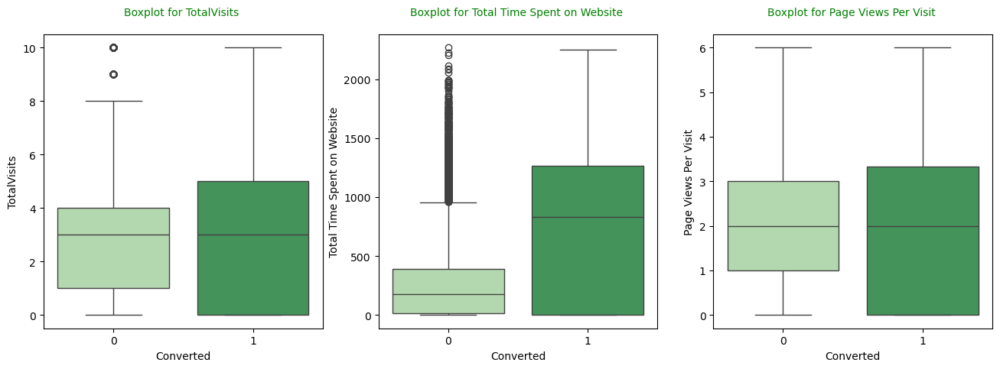

In [68]:
Bivariate_Analysis(ls_data, out_cols)

### Visualising Categorical Variables

In [70]:

categorical_features=[feature for feature in ls_data.columns if ls_data[feature].dtype=="object"]
print(len(categorical_features))
print(categorical_features)



19
['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity']


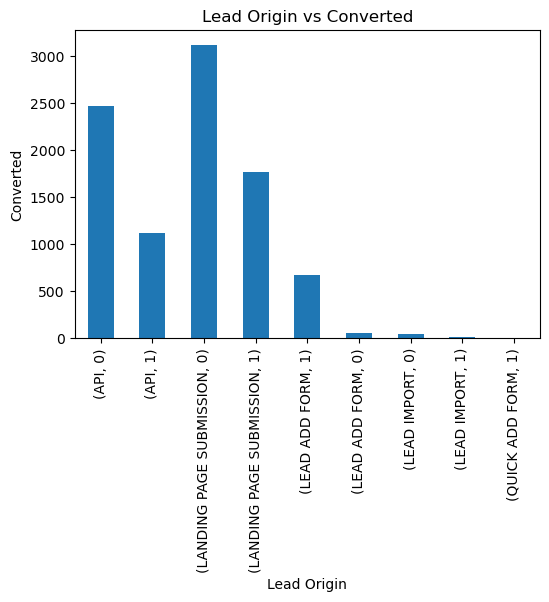

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


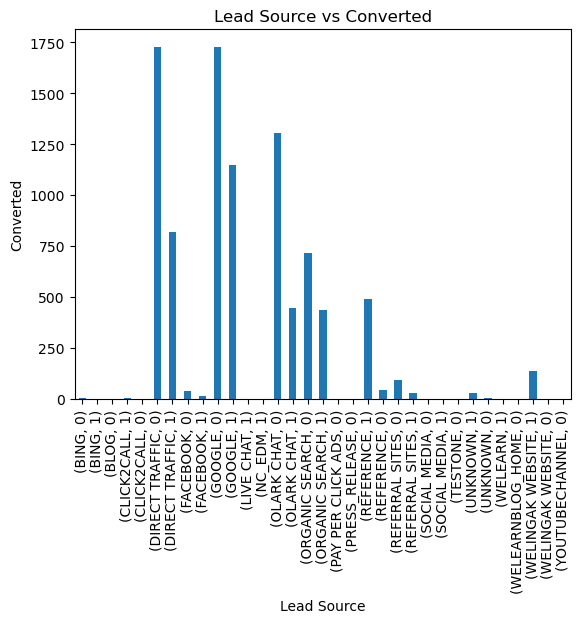

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


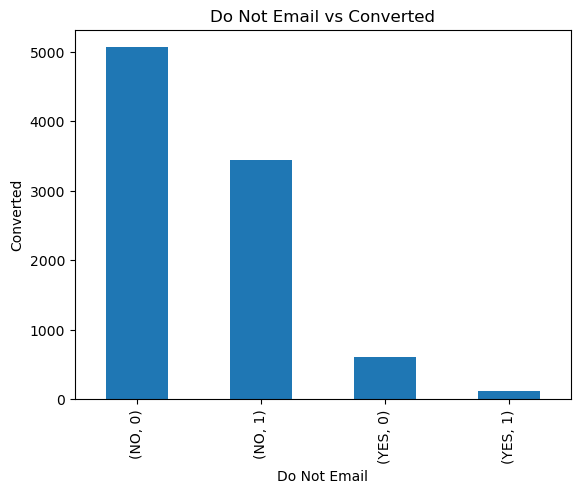

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


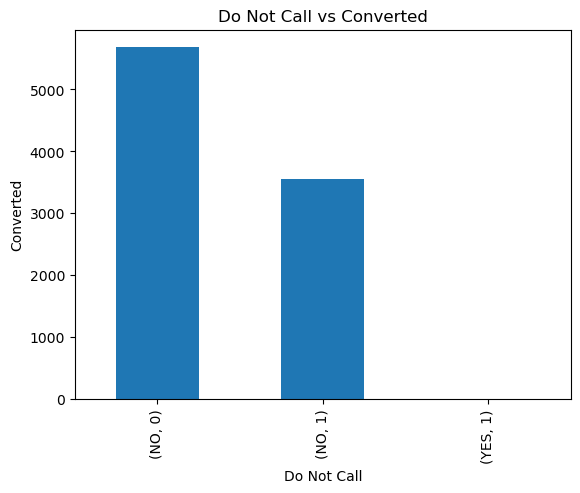

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


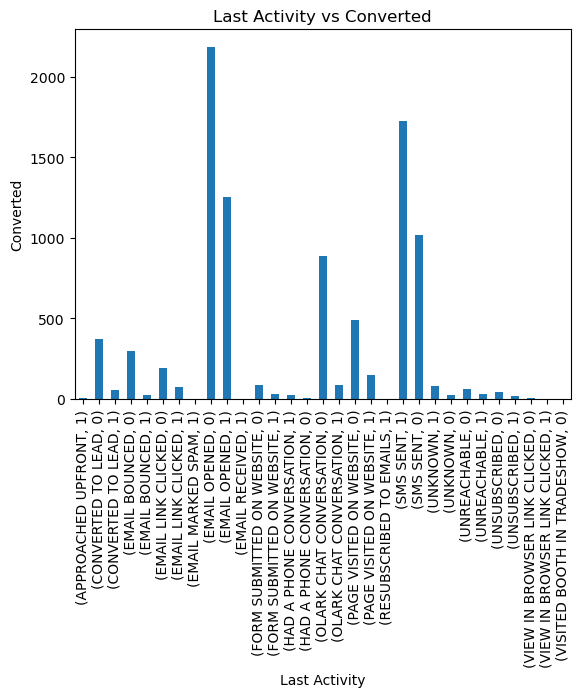

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


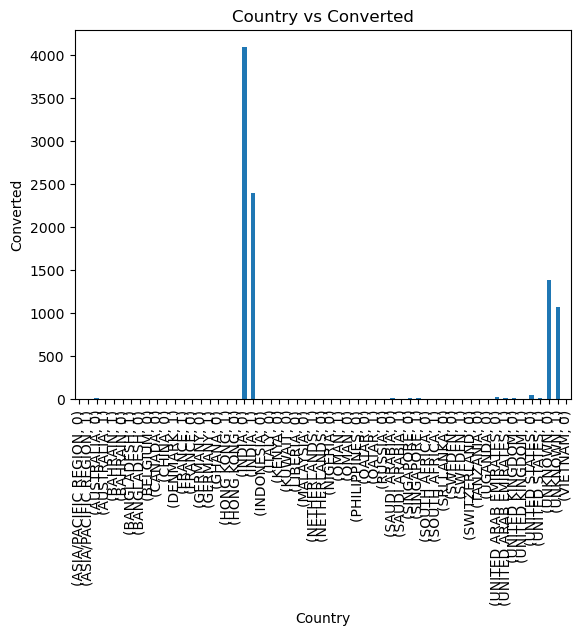

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


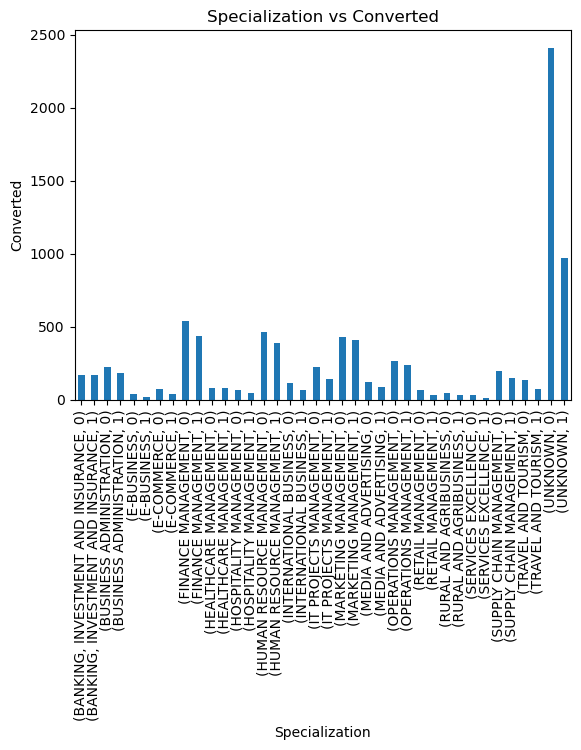

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


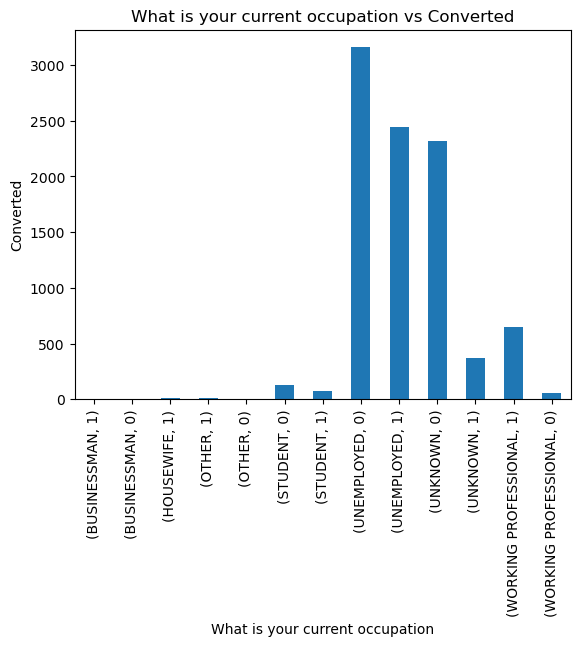

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


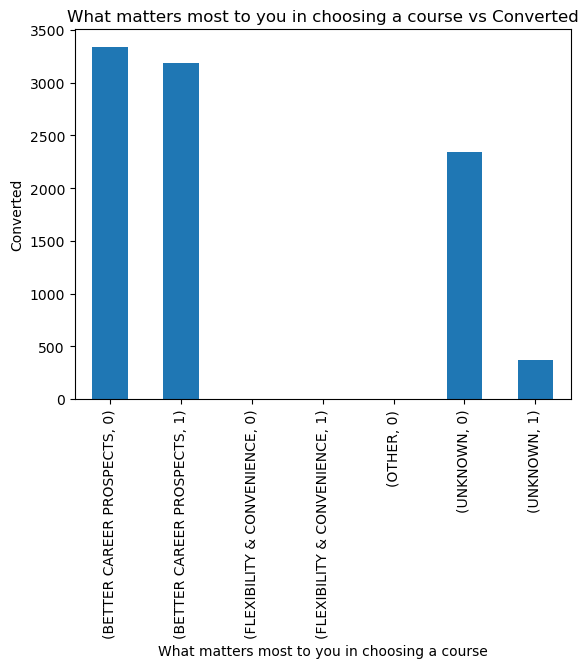

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


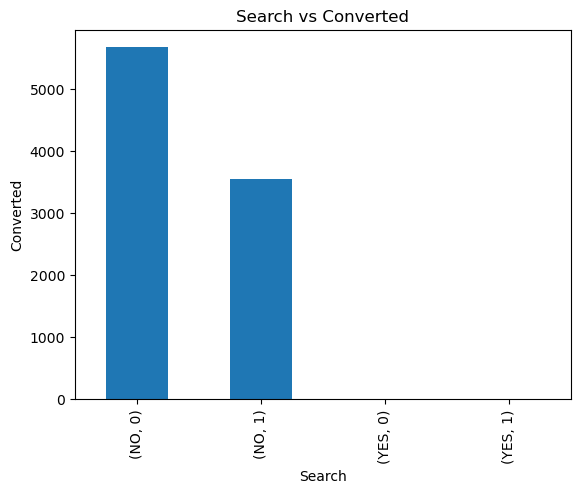

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


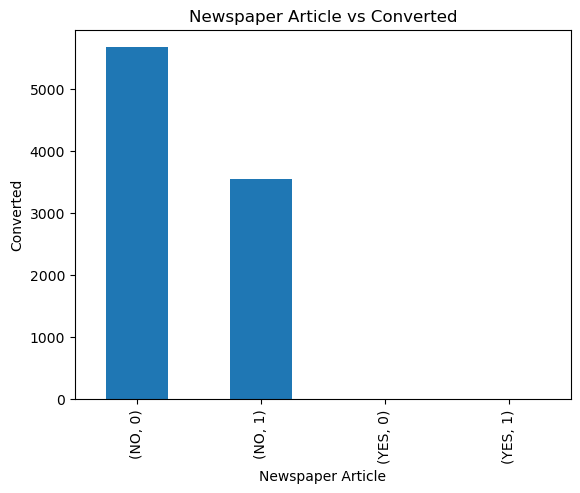

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


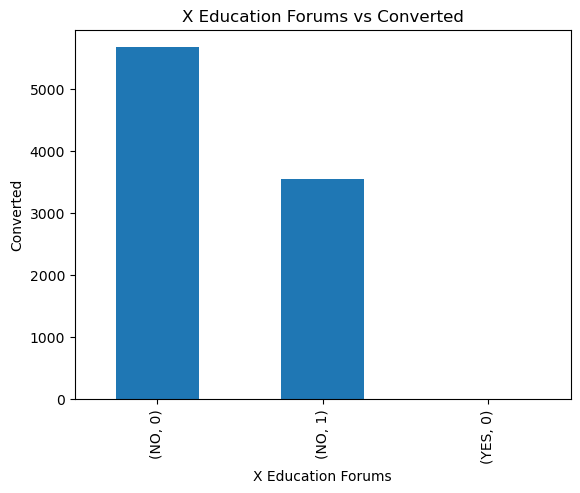

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


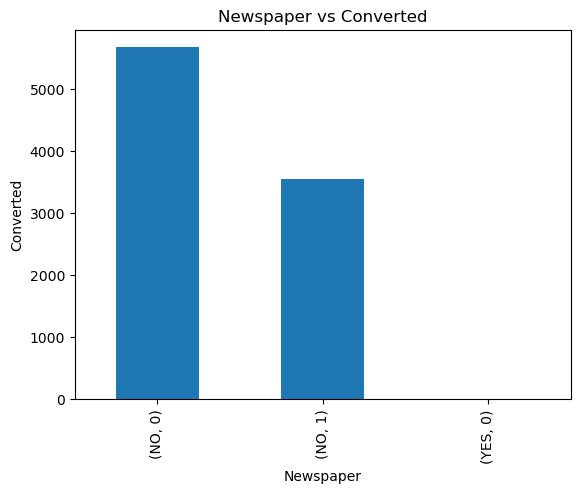

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


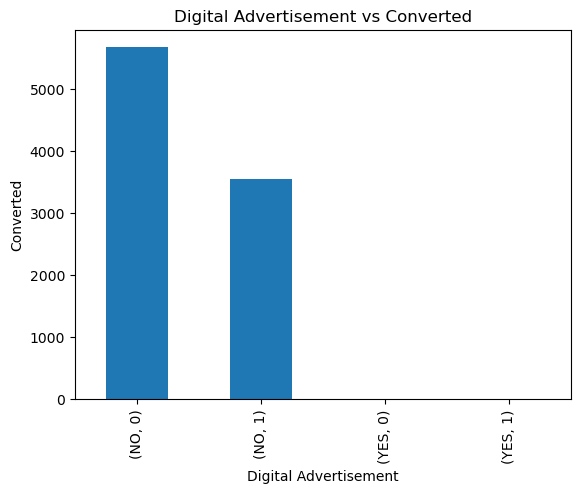

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


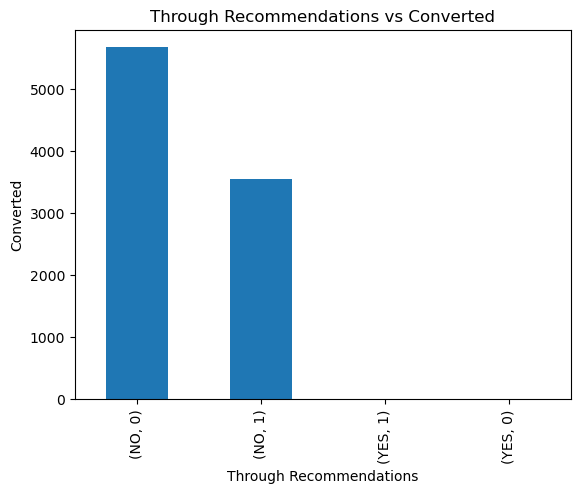

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


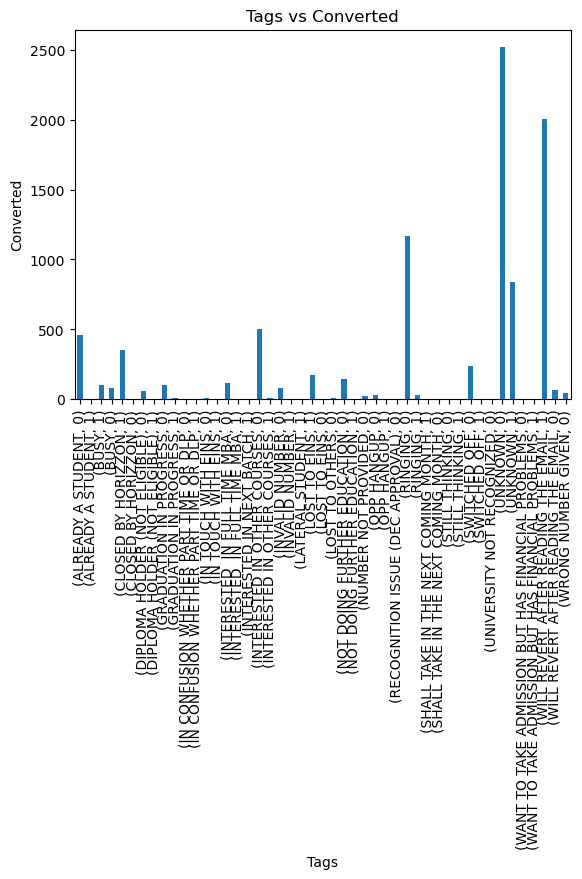

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


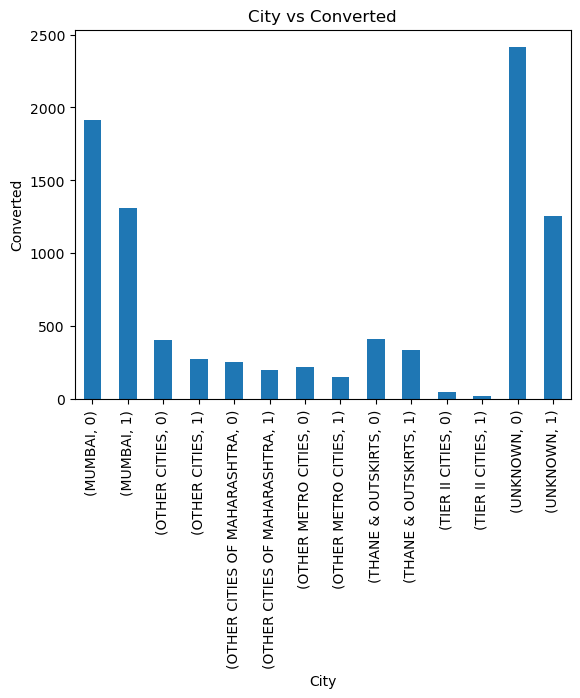

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


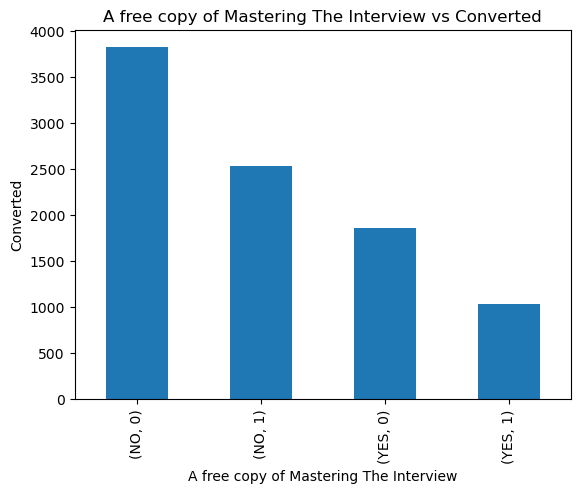

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


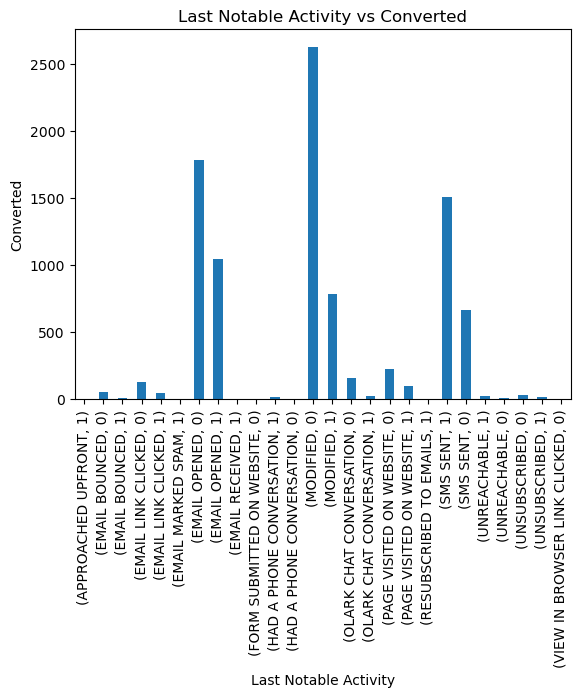

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [71]:
plt.figure(figsize=(6,4))
ct = 1
for feature in categorical_features:
    ls_data.groupby(feature)['Converted'].value_counts().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('Converted')
    plt.xticks(rotation=90)
    plt.title("{} vs Converted".format(feature))
    plt.show()
    ct+=1
    print('~'*100)

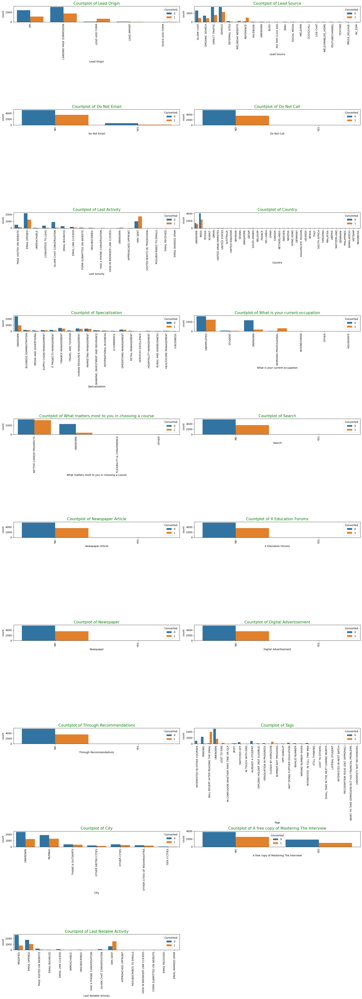

In [72]:
# Bivariate analysis for all categorical variables 
plt.figure(figsize= [20,55])
for i, cat_col in enumerate(categorical_features, 1):
    title_text= f'Countplot of {cat_col}'
    ax= plt.subplot(10, 2, i)
    x_label= f'{cat_col}'
    
    sns.countplot(data= ls_data, x= cat_col, hue= 'Converted', ax=ax)
    plt.title(title_text, fontdict={'fontsize': 15, 'fontweight' : 6, 'color' : 'Green'})
    plt.xticks(rotation=90)
plt.tight_layout()    
plt.show()

In [73]:
ls_data.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,UNKNOWN,NO,MODIFIED
1,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,UNKNOWN,NO,EMAIL OPENED
2,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,YES,EMAIL OPENED
3,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,MUMBAI,NO,MODIFIED
4,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,NO,MODIFIED


In [74]:
ls_data.nunique()

Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        12
Total Time Spent on Website                      1731
Page Views Per Visit                               92
Last Activity                                      18
Country                                            38
Specialization                                     19
What is your current occupation                     7
What matters most to you in choosing a course       4
Search                                              2
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                                           2
Digital Advertisement                               2
Through Recommendations     

In [75]:
# Keeping a copy of the dataset before doing any further changes

lead_data = ls_data
lead_data.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,OLARK CHAT,NO,NO,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,INTERESTED IN OTHER COURSES,UNKNOWN,NO,MODIFIED
1,API,ORGANIC SEARCH,NO,NO,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,UNKNOWN,NO,EMAIL OPENED
2,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,YES,EMAIL OPENED
3,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,NO,NO,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,RINGING,MUMBAI,NO,MODIFIED
4,LANDING PAGE SUBMISSION,GOOGLE,NO,NO,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,NO,NO,NO,NO,NO,NO,WILL REVERT AFTER READING THE EMAIL,MUMBAI,NO,MODIFIED


## Data Preparation
- Encoding :
    - Converting binary vars to 1/0
    - OtherOther categorical vars to dummy vars
- Splitting into train and test
- Rescaling of variables

#### Converting some binary variables (Yes/No) to 0/1

In [78]:
# List of variables to map

varlist =  ['Do Not Email', 'Do Not Call', 'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper', 
            'Digital Advertisement', 'Through Recommendations', 'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(x):
    return x.map({'YES': 1, "NO": 0})

# Applying the function to the housing list
ls_data[varlist] = ls_data[varlist].apply(binary_map)

In [79]:
ls_data.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,OLARK CHAT,0,0,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,INTERESTED IN OTHER COURSES,UNKNOWN,0,MODIFIED
1,API,ORGANIC SEARCH,0,0,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,RINGING,UNKNOWN,0,EMAIL OPENED
2,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,0,0,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,0,0,0,0,0,0,WILL REVERT AFTER READING THE EMAIL,MUMBAI,1,EMAIL OPENED
3,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,0,0,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,RINGING,MUMBAI,0,MODIFIED
4,LANDING PAGE SUBMISSION,GOOGLE,0,0,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,WILL REVERT AFTER READING THE EMAIL,MUMBAI,0,MODIFIED


In [80]:
ls_data.nunique()

Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        12
Total Time Spent on Website                      1731
Page Views Per Visit                               92
Last Activity                                      18
Country                                            38
Specialization                                     19
What is your current occupation                     7
What matters most to you in choosing a course       4
Search                                              2
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                                           2
Digital Advertisement                               2
Through Recommendations     

In [81]:
ls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 23 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   int64  
 3   Do Not Call                                    9240 non-null   int64  
 4   Converted                                      9240 non-null   int64  
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9240 non-null   object 
 9   Country                                        9240 

#### For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [83]:
categorical_features=[feature for feature in ls_data.columns if ls_data[feature].dtype=="object"]
print(len(categorical_features))
print(categorical_features)

10
['Lead Origin', 'Lead Source', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Tags', 'City', 'Last Notable Activity']


In [84]:
ls_data.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,OLARK CHAT,0,0,0,0.0,0,0.0,PAGE VISITED ON WEBSITE,UNKNOWN,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,INTERESTED IN OTHER COURSES,UNKNOWN,0,MODIFIED
1,API,ORGANIC SEARCH,0,0,0,5.0,674,2.5,EMAIL OPENED,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,RINGING,UNKNOWN,0,EMAIL OPENED
2,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,0,0,1,2.0,1532,2.0,EMAIL OPENED,INDIA,BUSINESS ADMINISTRATION,STUDENT,BETTER CAREER PROSPECTS,0,0,0,0,0,0,WILL REVERT AFTER READING THE EMAIL,MUMBAI,1,EMAIL OPENED
3,LANDING PAGE SUBMISSION,DIRECT TRAFFIC,0,0,0,1.0,305,1.0,UNREACHABLE,INDIA,MEDIA AND ADVERTISING,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,RINGING,MUMBAI,0,MODIFIED
4,LANDING PAGE SUBMISSION,GOOGLE,0,0,1,2.0,1428,1.0,CONVERTED TO LEAD,INDIA,UNKNOWN,UNEMPLOYED,BETTER CAREER PROSPECTS,0,0,0,0,0,0,WILL REVERT AFTER READING THE EMAIL,MUMBAI,0,MODIFIED


In [85]:
ls_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 23 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   int64  
 3   Do Not Call                                    9240 non-null   int64  
 4   Converted                                      9240 non-null   int64  
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9240 non-null   object 
 9   Country                                        9240 

In [86]:
categorical_features=[feature for feature in ls_data.columns if ls_data[feature].dtype=="object"]
print(len(categorical_features))
print(categorical_features)

10
['Lead Origin', 'Lead Source', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Tags', 'City', 'Last Notable Activity']


In [87]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy1 = pd.get_dummies(ls_data[categorical_features], drop_first=True, dtype=int)

# Adding the results to the master dataframe
ls_data_dummy = pd.concat([ls_data, dummy1], axis=1)

In [88]:
ls_data_dummy.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_UNKNOWN,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNKNOWN,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_UNKNOWN,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,Specialization_UNKNOWN,What is your current occupation_HOUSEWIFE,What is your current occupation_OTHER,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_UNKNOWN,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,What matters most to you in choosing a course_OTHER,What matters most to you in choosing a course_UNKNOWN,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_UNKNOWN,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHT

In [89]:
ls_data_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Columns: 175 entries, Lead Origin to Last Notable Activity_VIEW IN BROWSER LINK CLICKED
dtypes: float64(2), int32(152), int64(11), object(10)
memory usage: 7.0+ MB


In [90]:
categorical_features

['Lead Origin',
 'Lead Source',
 'Last Activity',
 'Country',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags',
 'City',
 'Last Notable Activity']

In [91]:
# Dropping the old Categorical columns from the dataset after concatenation
ls_data_dummy.drop(categorical_features, axis = 1, inplace = True)

In [92]:
ls_data_dummy.head()

,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_UNKNOWN,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNKNOWN,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_UNKNOWN,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,Specialization_UNKNOWN,What is your current occupation_HOUSEWIFE,What is your current occupation_OTHER,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_UNKNOWN,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,What matters most to you in choosing a course_OTHER,What matters most to you in choosing a course_UNKNOWN,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_UNKNOWN,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,City_UNKNOWN,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notabl

In [93]:
ls_data_dummy.columns

Index(['Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       ...
       'Last Notable Activity_FORM SUBMITTED ON WEBSITE',
       'Last Notable Activity_HAD A PHONE CONVERSATION',
       'Last Notable Activity_MODIFIED',
       'Last Notable Activity_OLARK CHAT CONVERSATION',
       'Last Notable Activity_PAGE VISITED ON WEBSITE',
       'Last Notable Activity_RESUBSCRIBED TO EMAILS',
       'Last Notable Activity_SMS SENT', 'Last Notable Activity_UNREACHABLE',
       'Last Notable Activity_UNSUBSCRIBED',
       'Last Notable Activity_VIEW IN BROWSER LINK CLICKED'],
      dtype='object', length=165)

In [94]:
print (ls_data_dummy.columns[ls_data_dummy.columns.str.endswith('_OTHER')])

Index(['What is your current occupation_OTHER', 'What matters most to you in choosing a course_OTHER'], dtype='object')


In [95]:
print (ls_data_dummy.columns[ls_data_dummy.columns.str.endswith('_UNKNOWN')])

Index(['Lead Source_UNKNOWN', 'Last Activity_UNKNOWN', 'Country_UNKNOWN',
       'Specialization_UNKNOWN', 'What is your current occupation_UNKNOWN',
       'What matters most to you in choosing a course_UNKNOWN', 'Tags_UNKNOWN',
       'City_UNKNOWN'],
      dtype='object')


In [96]:
# Deleting all the columns with UNKNOWN and OTHER category
cols_to_drop = ['Lead Source_UNKNOWN', 'Last Activity_UNKNOWN', 'Country_UNKNOWN',
       'Specialization_UNKNOWN', 'What is your current occupation_UNKNOWN',
       'What matters most to you in choosing a course_UNKNOWN', 'Tags_UNKNOWN',
       'City_UNKNOWN', 'What is your current occupation_OTHER', 
                'What matters most to you in choosing a course_OTHER']
ls_data_dummy.drop(cols_to_drop, axis = 1, inplace = True)

In [97]:
ls_data_dummy.columns.tolist()

['Do Not Email',
 'Do Not Call',
 'Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Search',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'A free copy of Mastering The Interview',
 'Lead Origin_LANDING PAGE SUBMISSION',
 'Lead Origin_LEAD ADD FORM',
 'Lead Origin_LEAD IMPORT',
 'Lead Origin_QUICK ADD FORM',
 'Lead Source_BLOG',
 'Lead Source_CLICK2CALL',
 'Lead Source_DIRECT TRAFFIC',
 'Lead Source_FACEBOOK',
 'Lead Source_GOOGLE',
 'Lead Source_LIVE CHAT',
 'Lead Source_NC_EDM',
 'Lead Source_OLARK CHAT',
 'Lead Source_ORGANIC SEARCH',
 'Lead Source_PAY PER CLICK ADS',
 'Lead Source_PRESS_RELEASE',
 'Lead Source_REFERENCE',
 'Lead Source_REFERRAL SITES',
 'Lead Source_SOCIAL MEDIA',
 'Lead Source_TESTONE',
 'Lead Source_WELEARN',
 'Lead Source_WELEARNBLOG_HOME',
 'Lead Source_WELINGAK WEBSITE',
 'Lead Source_YOUTUBECHANNEL',
 'Last Activity_CONVERTED TO LEAD',
 'Last Activity_EMA

In [98]:
print (ls_data_dummy.columns[ls_data_dummy.columns.str.endswith('_UNKNOWN')])

Index([], dtype='object')


In [99]:
null_percent = ((ls_data_dummy.isnull().sum())/len(ls_data_dummy))*100
null_percent

Do Not Email                                                               0.0
Do Not Call                                                                0.0
Converted                                                                  0.0
TotalVisits                                                                0.0
Total Time Spent on Website                                                0.0
Page Views Per Visit                                                       0.0
Search                                                                     0.0
Newspaper Article                                                          0.0
X Education Forums                                                         0.0
Newspaper                                                                  0.0
Digital Advertisement                                                      0.0
Through Recommendations                                                    0.0
A free copy of Mastering The Interview              

In [100]:
ls_data_dummy.shape

(9240, 155)

## Splitting the Data into Training and Testing Sets

In [102]:
df_train, df_test = train_test_split(ls_data_dummy, train_size = 0.7, test_size = 0.3, random_state=100)
print(df_train.shape)
print(df_test.shape)

(6468, 155)
(2772, 155)


In [103]:
# Dividing the data set in x and y for Model Building 
X_train = df_train.drop(['Converted'], axis = 1)
y_train = df_train['Converted']

In [104]:
X_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,What is your current occupation_HOUSEWIFE,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notable Activity_EMAIL MARKED SPAM,Last Notable Activity_EMAIL OPENED,Last Notable Activity_EMAIL RECEIVED,Last Notable Activity_FORM SUBMITTED ON WEBSITE,Last Notable Activity_HAD A PHONE CONVERSATION,Last Notable Activity_MODIFIED,Last Notable Activity_OLARK CHAT CONVERSATION,Last Notable Activity_PAGE V

### Rescaling the Features 

In [106]:
# Min-Max Scaler
# 1. Instantiate an Object
scaler = StandardScaler()

# Create a list of Neumeric vars
num_vars = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']
num_vars
# 2. Fit on data
X_train[num_vars] = scaler.fit_transform(X_train[num_vars])
X_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,What is your current occupation_HOUSEWIFE,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notable Activity_EMAIL MARKED SPAM,Last Notable Activity_EMAIL OPENED,Last Notable Activity_EMAIL RECEIVED,Last Notable Activity_FORM SUBMITTED ON WEBSITE,Last Notable Activity_HAD A PHONE CONVERSATION,Last Notable Activity_MODIFIED,Last Notable Activity_OLARK CHAT CONVERSATION,Last Notable Activity_PAGE V

In [107]:
X_train.corr()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,What is your current occupation_HOUSEWIFE,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notable Activity_EMAIL MARKED SPAM,Last Notable Activity_EMAIL OPENED,Last Notable Activity_EMAIL RECEIVED,Last Notable Activity_FORM SUBMITTED ON WEBSITE,Last Notable Activity_HAD A PHONE CONVERSATION,Last Notable Activity_MODIFIED,Last Notable Activity_OLARK CHAT CONVERSATION,Last Notable Activity_PAGE V

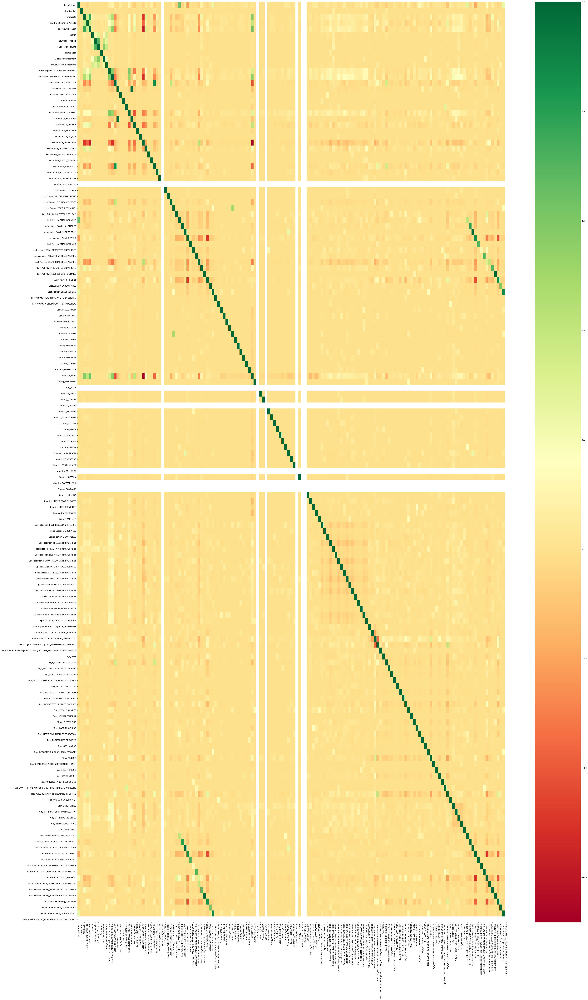

In [108]:
# Checking correlation
plt.figure(figsize = (50,86))
sns.heatmap(X_train.corr(numeric_only=True), cmap = "RdYlGn")
plt.show()

In [109]:
# Dropping features with NaN values
cols_to_drop = ['Lead Source_TESTONE' , 'Country_ITALY' ,'Country_LIBERIA', 'Country_SRI LANKA',
                'Country_SWITZERLAND', 'Country_TANZANIA', 'Last Notable Activity_VIEW IN BROWSER LINK CLICKED'
                ]
X_train = X_train.drop(cols_to_drop, axis = 1)

In [110]:
X_train.corr()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_KENYA,Country_KUWAIT,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SWEDEN,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,What is your current occupation_HOUSEWIFE,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notable Activity_EMAIL MARKED SPAM,Last Notable Activity_EMAIL OPENED,Last Notable Activity_EMAIL RECEIVED,Last Notable Activity_FORM SUBMITTED ON WEBSITE,Last Notable Activity_HAD A PHONE CONVERSATION,Last Notable Activity_MODIFIED,Last Notable Activity_OLARK CHAT CONVERSATION,Last Notable Activity_PAGE VISITED ON WEBSITE,Last Notable Activity_RESUBSCRIBED TO EMAILS,Last Notable Activity_SMS SENT,Last Notabl

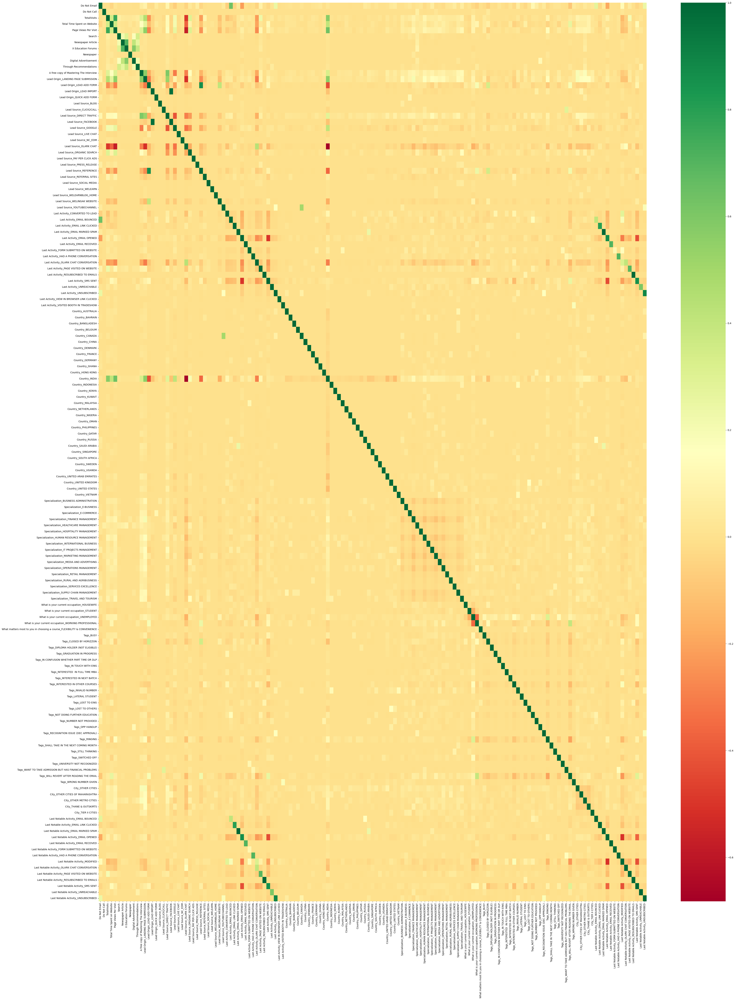

In [111]:
# Checking correlation again
plt.figure(figsize = (50,66))
sns.heatmap(X_train.corr(numeric_only=True), cmap = "RdYlGn")
plt.show()

### Model Building

In [113]:
import statsmodels.api as sm

#### Running the First Training Model

In [115]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6323
Model Family:                Binomial   Df Model:                          144
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 21 Jan 2025   Deviance:                       56183.
Time:                        16:12:30   Pearson chi2:                 2.75e+18
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                     -1.8e+14   2.82e+07  -6.38e+06      0.000    -1.8e+14    -1.8e+14
Do Not Email                                                            -1.618e+14   4.48e+06  -3.61e+07      0.000   -1.62e+14   -1.62e+14
Do Not Call                                                              4.238e+15   4.78e+07   8.87e+07      0.000    4.24e+15    4.24e+15
TotalVisits                                                              7.601e+13   1.44e+06   5.29e+07      0.000     7.6e+13     7.6e+13
Total Time Spent on Website                                              1.128e+14   1.03e+06   1.09e+08      0.000    1.13e+14    1.13e+14
Page Views Per Visit                                                    -4.282e+13   1.56e+06  -2.74e+07      0.000   -4.28e+13   -4.28e+13
Search                                                                   1.567e+14   2.22e+07   7.07e+06      0.000    1.57e+14    1.57e+14
Newspaper Article                                                       -4.329e+14   6.74e+07  -6.43e+06      0.000   -4.33e+14   -4.33e+14
X Education Forums                                                       1.288e+15   1.12e+08   1.15e+07      0.000    1.29e+15    1.29e+15
Newspaper                                                               -6.985e+14   6.74e+07  -1.04e+07      0.000   -6.99e+14   -6.99e+14
Digital Advertisement                                                    -5.71e+15   4.82e+07  -1.19e+08      0.000   -5.71e+15   -5.71e+15
Through Recommendations                                                  4.451e+14   2.86e+07   1.55e+07      0.000    4.45e+14    4.45e+14
A free copy of Mastering The Interview                                   1.045e+13   2.73e+06   3.83e+06      0.000    1.04e+13    1.04e+13
Lead Origin_LANDING PAGE SUBMISSION                                      -2.01e+13   3.26e+06  -6.17e+06      0.000   -2.01e+13   -2.01e+13
Lead Origin_LEAD ADD FORM                                               -3.179e+14   2.78e+07  -1.14e+07      0.000   -3.18e+14   -3.18e+14
Lead Origin_LEAD IMPORT                                                  2.421e+15   5.18e+07   4.67e+07      0.000    2.42e+15    2.42e+15
Lead Origin_QUICK ADD FORM                                               7.426e+15   7.35e+07   1.01e+08      0.000    7.43e+15    7.43e+15
Lead Source_BLOG                                                        -1.418e+14   7.26e+07  -1.95e+06      0.000   -1.42e+14   -1.42e+14
Lead Source_CLICK2CALL                                                  -9.913e+14   4.27e+07  -2.32e+07      0.000   -9.91e+14   -9.91e+14
Lea

### Feature Selection Using RFE

In [117]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [118]:
# running RFE with 15 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select = 15)             
rfe = rfe.fit(X_train, y_train)

In [119]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', False, 11),
 ('Do Not Call', False, 102),
 ('TotalVisits', False, 56),
 ('Total Time Spent on Website', False, 9),
 ('Page Views Per Visit', False, 59),
 ('Search', False, 30),
 ('Newspaper Article', False, 115),
 ('X Education Forums', False, 101),
 ('Newspaper', False, 88),
 ('Digital Advertisement', False, 57),
 ('Through Recommendations', False, 119),
 ('A free copy of Mastering The Interview', False, 58),
 ('Lead Origin_LANDING PAGE SUBMISSION', False, 8),
 ('Lead Origin_LEAD ADD FORM', False, 10),
 ('Lead Origin_LEAD IMPORT', False, 44),
 ('Lead Origin_QUICK ADD FORM', False, 80),
 ('Lead Source_BLOG', False, 84),
 ('Lead Source_CLICK2CALL', False, 62),
 ('Lead Source_DIRECT TRAFFIC', False, 38),
 ('Lead Source_FACEBOOK', False, 25),
 ('Lead Source_GOOGLE', False, 55),
 ('Lead Source_LIVE CHAT', False, 127),
 ('Lead Source_NC_EDM', False, 27),
 ('Lead Source_OLARK CHAT', False, 110),
 ('Lead Source_ORGANIC SEARCH', False, 53),
 ('Lead Source_PAY PER CLICK ADS', 

In [120]:
col = X_train.columns[rfe.support_]
col

Index(['Lead Source_WELINGAK WEBSITE', 'Last Activity_SMS SENT',
       'Tags_CLOSED BY HORIZZON', 'Tags_DIPLOMA HOLDER (NOT ELIGIBLE)',
       'Tags_INTERESTED  IN FULL TIME MBA', 'Tags_INTERESTED IN OTHER COURSES',
       'Tags_INVALID NUMBER', 'Tags_LOST TO EINS',
       'Tags_NOT DOING FURTHER EDUCATION', 'Tags_NUMBER NOT PROVIDED',
       'Tags_RINGING', 'Tags_SWITCHED OFF',
       'Tags_WILL REVERT AFTER READING THE EMAIL', 'Tags_WRONG NUMBER GIVEN',
       'Last Notable Activity_MODIFIED'],
      dtype='object')

In [121]:
X_train.columns[~rfe.support_]

Index(['Do Not Email', 'Do Not Call', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Search',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement',
       ...
       'Last Notable Activity_EMAIL OPENED',
       'Last Notable Activity_EMAIL RECEIVED',
       'Last Notable Activity_FORM SUBMITTED ON WEBSITE',
       'Last Notable Activity_HAD A PHONE CONVERSATION',
       'Last Notable Activity_OLARK CHAT CONVERSATION',
       'Last Notable Activity_PAGE VISITED ON WEBSITE',
       'Last Notable Activity_RESUBSCRIBED TO EMAILS',
       'Last Notable Activity_SMS SENT', 'Last Notable Activity_UNREACHABLE',
       'Last Notable Activity_UNSUBSCRIBED'],
      dtype='object', length=132)

In [122]:
# Creating a new X_train_rfe dataframe with RFE selected variables
X_train_rfe = X_train[col]

### MODEL 2

In [124]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6452
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1483.3
Date:                Tue, 21 Jan 2025   Deviance:                       2966.5
Time:                        16:12:36   Pearson chi2:                 1.67e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5813
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.4863      0.070    -21.236      0.000      -1.624      -1.349
Lead Source_WELINGAK WEBSITE                 4.8549      0.753      6.447      0.000       3.379       6.331
Last Activity_SMS SENT                       2.2816      0.105     21.684      0.000       2.075       2.488
Tags_CLOSED BY HORIZZON                      8.1847      1.009      8.114      0.000       6.208      10.162
Tags_DIPLOMA HOLDER (NOT ELIGIBLE)         -22.5450   1.83e+04     -0.001      0.999   -3.58e+04    3.58e+04
Tags_INTERESTED  IN FULL TIME MBA           -1.6211      0.725     -2.235      0.025      -3.043      -0.199
Tags_INTERESTED IN OTHER COURSES            -1.4090      0.327     -4.313      0.000      -2.049      -0.769
Tags_INVALID NUMBER                         -3.8427      1.024     -3.754      0.000      -5.849      -1.837
Tags_LOST TO EINS                            6.6036      0.725      9.107      0.000       5.182       8.025
Tags_NOT DOING FURTHER EDUCATION            -2.7350      1.023     -2.674      0.007      -4.739      -0.731
Tags_NUMBER NOT PROVIDED                   -23.9569   2.48e+04     -0.001      0.999   -4.86e+04    4.86e+04
Tags_RINGING                                -3.3022      0.221    -14.931      0.000      -3.736      -2.869
Tags_SWITCHED OFF                           -3.7765      0.518     -7.292      0.000      -4.792      -2.761
Tags_WILL REVERT AFTER READING THE EMAIL     4.9356      0.174     28.336      0.000       4.594       5.277
Tags_WRONG NUMBER GIVEN                    -24.1116   2.11e+04     -0.001      0.999   -4.14e+04    4.14e+04
Last Notable Activity_MODIFIED              -1.7661      0.116    -15.286      0.000      -1.993      -1.540
============================================================================================================
"""

In [125]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Last Activity_SMS SENT,1.44
14,Last Notable Activity_MODIFIED,1.30
12,Tags_WILL REVERT AFTER READING THE EMAIL,1.29
5,Tags_INTERESTED IN OTHER COURSES,1.11
10,Tags_RINGING,1.09
2,Tags_CLOSED BY HORIZZON,1.06
0,Lead Source_WELINGAK WEBSITE,1.03
7,Tags_LOST TO EINS,1.03
8,Tags_NOT DOING FURTHER EDUCATION,1.03
11,Tags_SWITCHED OFF,1.03


In [126]:
X_train_rfe.head()

,Lead Source_WELINGAK WEBSITE,Last Activity_SMS SENT,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LOST TO EINS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_RINGING,Tags_SWITCHED OFF,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,Last Notable Activity_MODIFIED
1871,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
6795,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3516,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8105,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3934,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### Now need to compare p-values and VIF for the features

### Insights from MODEL 2 Summary
- VIF values look good, But P-values are still not in range
- Dropping 'Tags_WRONG NUMBER GIVEN'

In [129]:
# Dropping 'Last Activity_RESUBSCRIBED TO EMAILS' Column and creating new Dataset X_train_New
X_train_New = X_train_rfe.drop(['Tags_WRONG NUMBER GIVEN'], axis = 1)

In [130]:
X_train_New.head()

,Lead Source_WELINGAK WEBSITE,Last Activity_SMS SENT,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LOST TO EINS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_RINGING,Tags_SWITCHED OFF,Tags_WILL REVERT AFTER READING THE EMAIL,Last Notable Activity_MODIFIED
1871,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6795,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3516,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8105,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3934,0,0,0,0,0,0,0,0,0,0,0,0,0,1


#### Generelizing the process for further Model Evaluations

In [132]:
# Defining Generalized function to calculate the P-Value
def Build_GLM_Model(X,y):
    X_sm = sm.add_constant(X)
    lm = sm.GLM(y,X_sm, family = sm.families.Binomial()).fit()
    print(lm.summary())
    return (lm)

In [133]:
# Defining Generalized function to calculate the VIF
def Calculate_VIF(X) :
    vif = pd.DataFrame()
    vif['features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range (X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = 'VIF', ascending= False)
    return(vif)

### MODEL 3

In [135]:
X_train_sm_func = Build_GLM_Model(X_train_New,y_train)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6453
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1497.5
Date:                Tue, 21 Jan 2025   Deviance:                       2995.0
Time:                        16:12:36   Pearson chi2:                 1.61e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5795
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [136]:
#Calculating the Variance Inflation Factor
Calculate_VIF(X_train_New)

,features,VIF
1,Last Activity_SMS SENT,1.43
12,Tags_WILL REVERT AFTER READING THE EMAIL,1.29
13,Last Notable Activity_MODIFIED,1.29
5,Tags_INTERESTED IN OTHER COURSES,1.11
10,Tags_RINGING,1.09
2,Tags_CLOSED BY HORIZZON,1.06
0,Lead Source_WELINGAK WEBSITE,1.03
7,Tags_LOST TO EINS,1.03
8,Tags_NOT DOING FURTHER EDUCATION,1.03
11,Tags_SWITCHED OFF,1.03


### Insights from MODEL 3 Summary
- After considering VIF value and P-value, Dropping 'Tags_NUMBER NOT PROVIDED'

In [138]:
# Dropping 'Lead Source_FACEBOOK' Column and creating new Dataset X_train_New
X_train_New = X_train_New.drop(['Tags_NUMBER NOT PROVIDED'], axis = 1)

### MODEL 4

In [140]:
X_train_sm_func = Build_GLM_Model(X_train_New,y_train)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6454
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1505.9
Date:                Tue, 21 Jan 2025   Deviance:                       3011.9
Time:                        16:12:37   Pearson chi2:                 1.57e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5784
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [141]:
#Calculating the Variance Inflation Factor
Calculate_VIF(X_train_New)

,features,VIF
1,Last Activity_SMS SENT,1.43
11,Tags_WILL REVERT AFTER READING THE EMAIL,1.29
12,Last Notable Activity_MODIFIED,1.29
5,Tags_INTERESTED IN OTHER COURSES,1.11
9,Tags_RINGING,1.09
2,Tags_CLOSED BY HORIZZON,1.06
0,Lead Source_WELINGAK WEBSITE,1.03
7,Tags_LOST TO EINS,1.03
8,Tags_NOT DOING FURTHER EDUCATION,1.03
10,Tags_SWITCHED OFF,1.03


### Insights from MODEL 4 Summary
- After considering VIF value and P-value, Dropping 'Tags_DIPLOMA HOLDER (NOT ELIGIBLE)'

In [143]:
# Dropping 'Lead Source_FACEBOOK' Column and creating new Dataset X_train_New
X_train_New = X_train_New.drop(['Tags_DIPLOMA HOLDER (NOT ELIGIBLE)'], axis = 1)

### MODEL 5

In [145]:
X_train_sm_func = Build_GLM_Model(X_train_New,y_train)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6455
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1511.9
Date:                Tue, 21 Jan 2025   Deviance:                       3023.8
Time:                        16:12:37   Pearson chi2:                 1.60e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5776
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [146]:
#Calculating the Variance Inflation Factor
Calculate_VIF(X_train_New)

,features,VIF
1,Last Activity_SMS SENT,1.43
10,Tags_WILL REVERT AFTER READING THE EMAIL,1.29
11,Last Notable Activity_MODIFIED,1.28
4,Tags_INTERESTED IN OTHER COURSES,1.11
8,Tags_RINGING,1.09
2,Tags_CLOSED BY HORIZZON,1.06
0,Lead Source_WELINGAK WEBSITE,1.03
6,Tags_LOST TO EINS,1.03
7,Tags_NOT DOING FURTHER EDUCATION,1.03
9,Tags_SWITCHED OFF,1.03


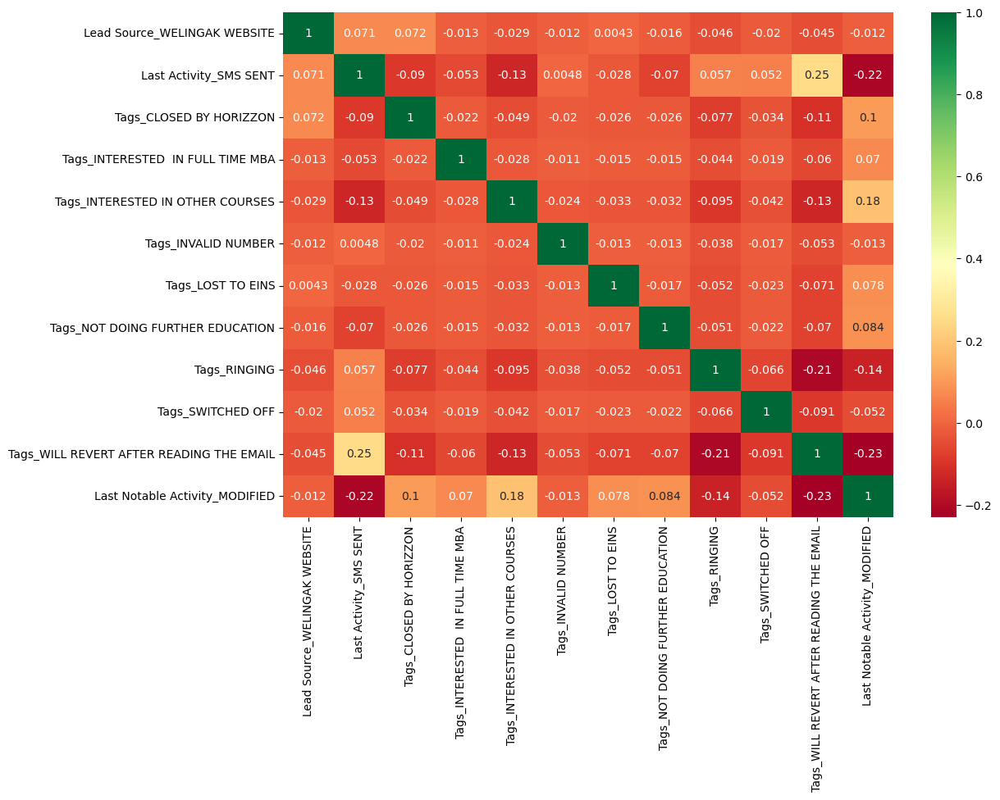

In [147]:
# Checking correlation of Final Model
plt.figure(figsize = (12,8))
sns.heatmap(X_train_New.corr(numeric_only=True),annot = True, cmap = "RdYlGn")
plt.show()

In [148]:
X_train_New.columns

Index(['Lead Source_WELINGAK WEBSITE', 'Last Activity_SMS SENT',
       'Tags_CLOSED BY HORIZZON', 'Tags_INTERESTED  IN FULL TIME MBA',
       'Tags_INTERESTED IN OTHER COURSES', 'Tags_INVALID NUMBER',
       'Tags_LOST TO EINS', 'Tags_NOT DOING FURTHER EDUCATION', 'Tags_RINGING',
       'Tags_SWITCHED OFF', 'Tags_WILL REVERT AFTER READING THE EMAIL',
       'Last Notable Activity_MODIFIED'],
      dtype='object')

##### Assessing the model with StatsModels

In [150]:
X_train_sm = sm.add_constant(X_train_New)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6455
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1511.9
Date:                Tue, 21 Jan 2025   Deviance:                       3023.8
Time:                        16:12:38   Pearson chi2:                 1.60e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5776
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.5349      0.070    -21.997      0.000      -1.672      -1.398
Lead Source_WELINGAK WEBSITE                 4.8911      0.752      6.505      0.000       3.417       6.365
Last Activity_SMS SENT                       2.2383      0.103     21.638      0.000       2.036       2.441
Tags_CLOSED BY HORIZZON                      8.2070      1.009      8.138      0.000       6.230      10.184
Tags_INTERESTED  IN FULL TIME MBA           -1.5751      0.725     -2.172      0.030      -2.996      -0.154
Tags_INTERESTED IN OTHER COURSES            -1.3587      0.326     -4.169      0.000      -1.997      -0.720
Tags_INVALID NUMBER                         -3.7576      1.023     -3.673      0.000      -5.763      -1.752
Tags_LOST TO EINS                            6.6272      0.725      9.142      0.000       5.206       8.048
Tags_NOT DOING FURTHER EDUCATION            -2.6810      1.022     -2.624      0.009      -4.683      -0.679
Tags_RINGING                                -3.2177      0.220    -14.610      0.000      -3.649      -2.786
Tags_SWITCHED OFF                           -3.6895      0.517     -7.131      0.000      -4.704      -2.675
Tags_WILL REVERT AFTER READING THE EMAIL     4.9710      0.174     28.640      0.000       4.631       5.311
Last Notable Activity_MODIFIED              -1.7358      0.115    -15.139      0.000      -1.960      -1.511
============================================================================================================
"""

In [151]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

1871    0.008556
6795    0.177280
3516    0.008556
8105    0.074860
3934    0.036592
4844    0.996579
3297    0.008556
8071    0.992871
987     0.036592
7423    0.996579
dtype: float64

In [152]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.00855562, 0.17728019, 0.00855562, 0.07486025, 0.03659241,
       0.99657893, 0.00855562, 0.99287071, 0.03659241, 0.99657893])

##### Creating a dataframe with the actual Converted flag and the predicted probabilities

In [154]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Lead Number'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,Lead Number
0,0,0.008556,1871
1,0,0.177280,6795
2,0,0.008556,3516
3,0,0.074860,8105
4,0,0.036592,3934


##### Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0

In [156]:
y_train_pred_final['Predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,Lead Number,Predicted
0,0,0.008556,1871,0
1,0,0.177280,6795,0
2,0,0.008556,3516,0
3,0,0.074860,8105,0
4,0,0.036592,3934,0


In [157]:
from sklearn import metrics

In [158]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion)

[[3830  172]
 [ 337 2129]]


In [159]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.9213048855905999


### Insights from MODEL 5 Summary
- VIF values look stable, Also P-values are still in range
- Proceeding with further Analysis
- Model Looks Stable
- good accuracy score received

### Calculating other Model Evaluation metrics

In [162]:
# Get Confusion matrix
TN,FP,FN,TP= metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted).ravel()
print(f'TN : {TN}, FP:{FP}, FN:{FN}, TP:{TP}')

TN : 3830, FP:172, FN:337, TP:2129


In [163]:
TN/FN

11.364985163204748

In [164]:
TP/FP

12.377906976744185

In [165]:
# Checking Sensitivity of our final model
print('Sensitivity / Recall: ',TP / float(TP+FN))

# Checking Specificity of our final model
print('Specificity: ', TN / float(TN+FP))

# Checking FPR (False Positive Rate) of our final model (1- specificity)
print('False Positive Rate: ',FP/ float(TN+FP))

# Checking Positive Predictive Value 
print('Positive Predictive Value: ',TP / float(TP+FP))

# Checking Negative Predictive Value
print('Negative Predictive Value: ',TN / float(TN+ FN))

Sensitivity / Recall:  0.8633414436334145
Specificity:  0.9570214892553723
False Positive Rate:  0.04297851074462768
Positive Predictive Value:  0.9252498913515863
Negative Predictive Value:  0.9191264698824094


## Plotting the ROC Curve

In [167]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [168]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, 
                                         y_train_pred_final.Converted_Prob, drop_intermediate = False )

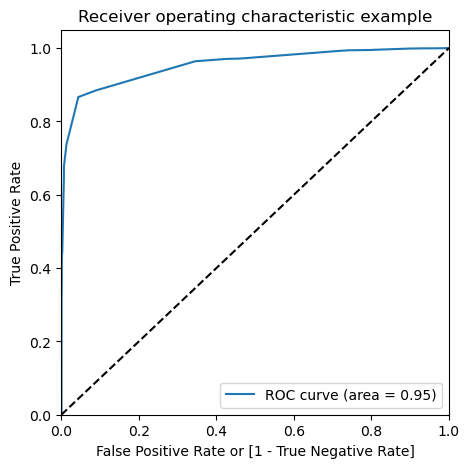

In [169]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

### Finding Optimal Cutoff Point

In [171]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.008556,1871,0,1,0,0,0,0,0,0,0,0,0
1,0,0.177280,6795,0,1,1,0,0,0,0,0,0,0,0
2,0,0.008556,3516,0,1,0,0,0,0,0,0,0,0,0
3,0,0.074860,8105,0,1,0,0,0,0,0,0,0,0,0
4,0,0.036592,3934,0,1,0,0,0,0,0,0,0,0,0


In [172]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.381262  1.000000  0.000000
0.1   0.1  0.771800  0.964315  0.653173
0.2   0.2  0.900897  0.884428  0.911044
0.3   0.3  0.922233  0.866180  0.956772
0.4   0.4  0.921305  0.863341  0.957021
0.5   0.5  0.921305  0.863341  0.957021
0.6   0.6  0.921305  0.863341  0.957021
0.7   0.7  0.891156  0.734793  0.987506
0.8   0.8  0.891156  0.734793  0.987506
0.9   0.9  0.872449  0.675994  0.993503


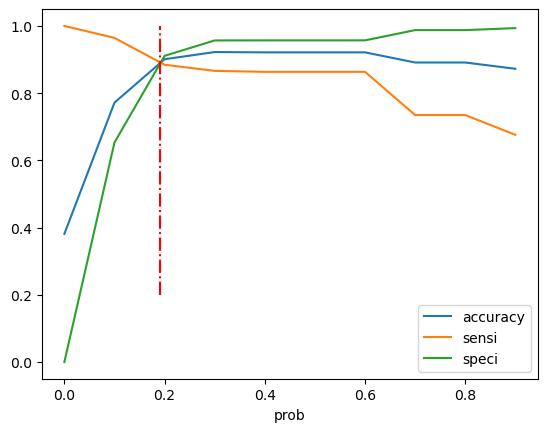

In [173]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.19, ymax=1, ymin=0.2, colors="r", linestyles="-.")
plt.show()

#### From the curve above, 0.19 is the optimum point to take it as a cutoff probability.

In [175]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.19 else 0)

y_train_pred_final.head()

,Converted,Converted_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.008556,1871,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.177280,6795,0,1,1,0,0,0,0,0,0,0,0,0
2,0,0.008556,3516,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.074860,8105,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.036592,3934,0,1,0,0,0,0,0,0,0,0,0,0


In [176]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted))

0.9008967223252937


In [177]:
# Get Confusion matrix
TN,FP,FN,TP= metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted).ravel()

In [178]:
# Checking Sensitivity of our final model
print('Sensitivity / Recall: ',TP / float(TP+FN))

# Checking Specificity of our final model
print('Specificity: ', TN / float(TN+FP))

# Checking FPR (False Positive Rate) of our final model (1- specificity)
print('False Positive Rate: ',FP/ float(TN+FP))

# Checking Positive Predictive Value 
print('Positive Predictive Value: ',TP / float(TP+FP))

# Checking Negative Predictive Value
print('Negative Predictive Value: ',TN / float(TN+ FN))

Sensitivity / Recall:  0.8844282238442822
Specificity:  0.9110444777611194
False Positive Rate:  0.08895552223888056
Positive Predictive Value:  0.8596767836026803
Negative Predictive Value:  0.927499364029509


## Precision and Recall

In [180]:
#Looking at the confusion matrix again
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion)

[[3830  172]
 [ 337 2129]]


##### Precision
TP / TP + FP

In [182]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.9252498913515863

##### Recall
TP / TP + FN

In [184]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.8633414436334145

In [185]:
from sklearn.metrics import precision_score, recall_score

In [186]:
precision_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)

0.9252498913515863

In [187]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)

0.8633414436334145

### Precision and recall tradeoff

In [189]:
from sklearn.metrics import precision_recall_curve

In [190]:
y_train_pred_final.Converted, y_train_pred_final.Predicted

(0       0
 1       0
 2       0
 3       0
 4       0
        ..
 6463    1
 6464    1
 6465    1
 6466    0
 6467    0
 Name: Converted, Length: 6468, dtype: int64,
 0       0
 1       0
 2       0
 3       0
 4       0
        ..
 6463    1
 6464    1
 6465    0
 6466    0
 6467    0
 Name: Predicted, Length: 6468, dtype: int64)

In [191]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

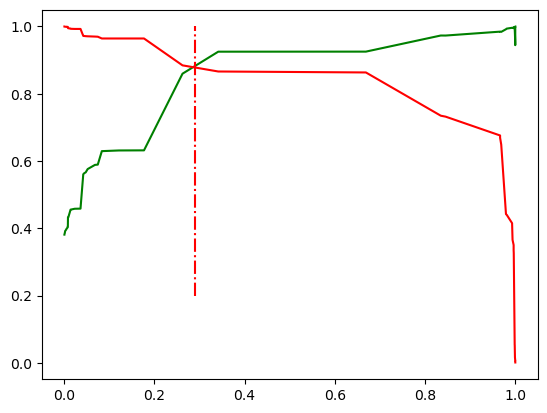

In [192]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.vlines(x=0.29, ymax=1, ymin=0.2, colors="r", linestyles="-.")
plt.show()

#### From the curve above, 0.29 is the optimum point to take it as a cutoff probability.

In [194]:
y_train_pred_final['final_predicted_pr'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.29 else 0)

y_train_pred_final.head()

,Converted,Converted_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted,final_predicted_pr
0,0,0.008556,1871,0,1,0,0,0,0,0,0,0,0,0,0,0
1,0,0.177280,6795,0,1,1,0,0,0,0,0,0,0,0,0,0
2,0,0.008556,3516,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0.074860,8105,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0.036592,3934,0,1,0,0,0,0,0,0,0,0,0,0,0


In [195]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted_pr))

0.9222325293753865


In [196]:
# Get Confusion matrix
TN,FP,FN,TP= metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted_pr).ravel()

In [197]:
# Checking Sensitivity of our final model
print('Sensitivity / Recall: ',TP / float(TP+FN))

# Checking Specificity of our final model
print('Specificity: ', TN / float(TN+FP))

# Checking FPR (False Positive Rate) of our final model (1- specificity)
print('False Positive Rate: ',FP/ float(TN+FP))

# Checking Positive Predictive Value 
print('Positive Predictive Value: ',TP / float(TP+FP))

# Checking Negative Predictive Value
print('Negative Predictive Value: ',TN / float(TN+ FN))

Sensitivity / Recall:  0.8661800486618005
Specificity:  0.9567716141929036
False Positive Rate:  0.04322838580709645
Positive Predictive Value:  0.9250757903854483
Negative Predictive Value:  0.9206540033661939


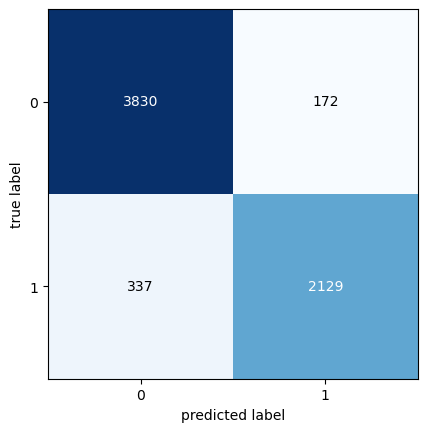

In [198]:

# To plot confusion matrix
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=confusion)
plt.show()
     

## Making predictions on the Test set

#### Dividing into X_test and y_test

In [201]:
X_test = df_test.drop(['Converted'], axis = 1)
y_test = df_test['Converted']

In [202]:
X_test.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview,Lead Origin_LANDING PAGE SUBMISSION,Lead Origin_LEAD ADD FORM,Lead Origin_LEAD IMPORT,Lead Origin_QUICK ADD FORM,Lead Source_BLOG,Lead Source_CLICK2CALL,Lead Source_DIRECT TRAFFIC,Lead Source_FACEBOOK,Lead Source_GOOGLE,Lead Source_LIVE CHAT,Lead Source_NC_EDM,Lead Source_OLARK CHAT,Lead Source_ORGANIC SEARCH,Lead Source_PAY PER CLICK ADS,Lead Source_PRESS_RELEASE,Lead Source_REFERENCE,Lead Source_REFERRAL SITES,Lead Source_SOCIAL MEDIA,Lead Source_TESTONE,Lead Source_WELEARN,Lead Source_WELEARNBLOG_HOME,Lead Source_WELINGAK WEBSITE,Lead Source_YOUTUBECHANNEL,Last Activity_CONVERTED TO LEAD,Last Activity_EMAIL BOUNCED,Last Activity_EMAIL LINK CLICKED,Last Activity_EMAIL MARKED SPAM,Last Activity_EMAIL OPENED,Last Activity_EMAIL RECEIVED,Last Activity_FORM SUBMITTED ON WEBSITE,Last Activity_HAD A PHONE CONVERSATION,Last Activity_OLARK CHAT CONVERSATION,Last Activity_PAGE VISITED ON WEBSITE,Last Activity_RESUBSCRIBED TO EMAILS,Last Activity_SMS SENT,Last Activity_UNREACHABLE,Last Activity_UNSUBSCRIBED,Last Activity_VIEW IN BROWSER LINK CLICKED,Last Activity_VISITED BOOTH IN TRADESHOW,Country_AUSTRALIA,Country_BAHRAIN,Country_BANGLADESH,Country_BELGIUM,Country_CANADA,Country_CHINA,Country_DENMARK,Country_FRANCE,Country_GERMANY,Country_GHANA,Country_HONG KONG,Country_INDIA,Country_INDONESIA,Country_ITALY,Country_KENYA,Country_KUWAIT,Country_LIBERIA,Country_MALAYSIA,Country_NETHERLANDS,Country_NIGERIA,Country_OMAN,Country_PHILIPPINES,Country_QATAR,Country_RUSSIA,Country_SAUDI ARABIA,Country_SINGAPORE,Country_SOUTH AFRICA,Country_SRI LANKA,Country_SWEDEN,Country_SWITZERLAND,Country_TANZANIA,Country_UGANDA,Country_UNITED ARAB EMIRATES,Country_UNITED KINGDOM,Country_UNITED STATES,Country_VIETNAM,Specialization_BUSINESS ADMINISTRATION,Specialization_E-BUSINESS,Specialization_E-COMMERCE,Specialization_FINANCE MANAGEMENT,Specialization_HEALTHCARE MANAGEMENT,Specialization_HOSPITALITY MANAGEMENT,Specialization_HUMAN RESOURCE MANAGEMENT,Specialization_INTERNATIONAL BUSINESS,Specialization_IT PROJECTS MANAGEMENT,Specialization_MARKETING MANAGEMENT,Specialization_MEDIA AND ADVERTISING,Specialization_OPERATIONS MANAGEMENT,Specialization_RETAIL MANAGEMENT,Specialization_RURAL AND AGRIBUSINESS,Specialization_SERVICES EXCELLENCE,Specialization_SUPPLY CHAIN MANAGEMENT,Specialization_TRAVEL AND TOURISM,What is your current occupation_HOUSEWIFE,What is your current occupation_STUDENT,What is your current occupation_UNEMPLOYED,What is your current occupation_WORKING PROFESSIONAL,What matters most to you in choosing a course_FLEXIBILITY & CONVENIENCE,Tags_BUSY,Tags_CLOSED BY HORIZZON,Tags_DIPLOMA HOLDER (NOT ELIGIBLE),Tags_GRADUATION IN PROGRESS,Tags_IN CONFUSION WHETHER PART TIME OR DLP,Tags_IN TOUCH WITH EINS,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN NEXT BATCH,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LATERAL STUDENT,Tags_LOST TO EINS,Tags_LOST TO OTHERS,Tags_NOT DOING FURTHER EDUCATION,Tags_NUMBER NOT PROVIDED,Tags_OPP HANGUP,Tags_RECOGNITION ISSUE (DEC APPROVAL),Tags_RINGING,Tags_SHALL TAKE IN THE NEXT COMING MONTH,Tags_STILL THINKING,Tags_SWITCHED OFF,Tags_UNIVERSITY NOT RECOGNIZED,Tags_WANT TO TAKE ADMISSION BUT HAS FINANCIAL PROBLEMS,Tags_WILL REVERT AFTER READING THE EMAIL,Tags_WRONG NUMBER GIVEN,City_OTHER CITIES,City_OTHER CITIES OF MAHARASHTRA,City_OTHER METRO CITIES,City_THANE & OUTSKIRTS,City_TIER II CITIES,Last Notable Activity_EMAIL BOUNCED,Last Notable Activity_EMAIL LINK CLICKED,Last Notable Activity_EMAIL MARKED SPAM,Last Notable Activity_EMAIL OPENED,Last Notable Activity_EMAIL RECEIVED,Last Notable Activity_FORM SUBMITTED ON WEBSITE,Last Notable Activity_HAD A PHONE CONVERSATION,Last Notable Activity_MODIFIED,Last Notable Activity_OLARK CHAT CONVERSATION,Last Notable Activity_PAGE V

In [203]:
num_vars = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

In [204]:
X_test[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']])

In [205]:
test_col = X_train_New.columns
X_test=X_test[test_col[:]]
X_test.head()

,Lead Source_WELINGAK WEBSITE,Last Activity_SMS SENT,Tags_CLOSED BY HORIZZON,Tags_INTERESTED IN FULL TIME MBA,Tags_INTERESTED IN OTHER COURSES,Tags_INVALID NUMBER,Tags_LOST TO EINS,Tags_NOT DOING FURTHER EDUCATION,Tags_RINGING,Tags_SWITCHED OFF,Tags_WILL REVERT AFTER READING THE EMAIL,Last Notable Activity_MODIFIED
4269,0,1,0,0,0,0,0,0,0,0,0,0
2376,0,1,0,0,0,0,0,0,0,0,1,0
7766,0,0,0,0,0,0,0,0,0,0,1,0
9199,0,0,0,0,0,0,0,0,0,0,0,1
4359,0,0,0,0,0,0,0,0,0,0,1,0


In [206]:
X_test_sm = sm.add_constant(X_test)

Making predictions on the test set

In [208]:
y_test_pred = res.predict(X_test_sm)

In [209]:
y_test_pred[:10]

4269    0.668934
2376    0.996579
7766    0.968815
9199    0.036592
4359    0.968815
9186    0.996579
1631    0.968815
8963    0.968815
8007    0.036592
5324    0.996579
dtype: float64

In [210]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [211]:
y_pred_1.head()

,0
4269,0.668934
2376,0.996579
7766,0.968815
9199,0.036592
4359,0.968815


In [212]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [213]:
y_test_df.head()

,Converted
4269,1
2376,1
7766,1
9199,0
4359,1


In [214]:
# Putting CustID to index
y_test_df['Lead Number'] = y_test_df.index

In [215]:
y_test_df.head()

,Converted,Lead Number
4269,1,4269
2376,1,2376
7766,1,7766
9199,0,9199
4359,1,4359


In [216]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [217]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [218]:
y_pred_final.head()

,Converted,Lead Number,0
0,1,4269,0.668934
1,1,2376,0.996579
2,1,7766,0.968815
3,0,9199,0.036592
4,1,4359,0.968815


In [219]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

In [220]:
y_pred_final.head()

,Converted,Lead Number,Converted_Prob
0,1,4269,0.668934
1,1,2376,0.996579
2,1,7766,0.968815
3,0,9199,0.036592
4,1,4359,0.968815


In [221]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Lead Number','Converted','Converted_Prob'], axis=1)

In [222]:
y_pred_final.head()

,Lead Number,Converted,Converted_Prob
0,4269,1,0.668934
1,2376,1,0.996579
2,7766,1,0.968815
3,9199,0,0.036592
4,4359,1,0.968815


In [223]:
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.29 else 0)

In [224]:
y_pred_final.head()

,Lead Number,Converted,Converted_Prob,final_predicted
0,4269,1,0.668934,1
1,2376,1,0.996579,1
2,7766,1,0.968815,1
3,9199,0,0.036592,0
4,4359,1,0.968815,1


In [225]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.922077922077922

In [226]:
print("Area under curve: ", metrics.roc_auc_score(y_pred_final.Converted, y_pred_final.Converted_Prob))

Area under curve:  0.9581188412663405


In [227]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1592,   85],
       [ 131,  964]], dtype=int64)

In [228]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [229]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8803652968036529

In [230]:
# Let us calculate specificity
TN / float(TN+FP)

0.9493142516398331

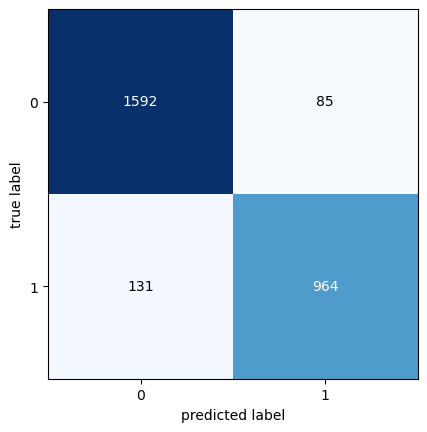

In [231]:

# To plot confusion matrix
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=confusion2)
plt.show()

In [232]:
# Checking Sensitivity of our final model
print('Sensitivity / Recall: ',TP / float(TP+FN))

# Checking Specificity of our final model
print('Specificity: ', TN / float(TN+FP))

# Checking FPR (False Positive Rate) of our final model (1- specificity)
print('False Positive Rate: ',FP/ float(TN+FP))

# Checking Positive Predictive Value 
print('Positive Predictive Value: ',TP / float(TP+FP))

# Checking Negative Predictive Value
print('Negative Predictive Value: ',TN / float(TN+ FN))

Sensitivity / Recall:  0.8803652968036529
Specificity:  0.9493142516398331
False Positive Rate:  0.05068574836016696
Positive Predictive Value:  0.9189704480457579
Negative Predictive Value:  0.9239698200812536


#### Classification Report

In [234]:
from sklearn.metrics import classification_report
print(classification_report(y_pred_final.Converted, y_pred_final.final_predicted))

              precision    recall  f1-score   support

           0       0.92      0.95      0.94      1677
           1       0.92      0.88      0.90      1095

    accuracy                           0.92      2772
   macro avg       0.92      0.91      0.92      2772
weighted avg       0.92      0.92      0.92      2772



## Determining Feature Importance

- Calculating Lead Score
- Lead Score = 100 * ConversionProbability
- Lead Score needa to be calculated for both Train and Test dataset.

In [237]:
# Selecting Test Dataset
leads_test_pred = y_pred_final.copy()
leads_test_pred.head()

,Lead Number,Converted,Converted_Prob,final_predicted
0,4269,1,0.668934,1
1,2376,1,0.996579,1
2,7766,1,0.968815,1
3,9199,0,0.036592,0
4,4359,1,0.968815,1


In [238]:
# Selecting Train Dataset
leads_train_pred = y_train_pred_final.copy()
leads_train_pred.head()

,Converted,Converted_Prob,Lead Number,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted,final_predicted_pr
0,0,0.008556,1871,0,1,0,0,0,0,0,0,0,0,0,0,0
1,0,0.177280,6795,0,1,1,0,0,0,0,0,0,0,0,0,0
2,0,0.008556,3516,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0.074860,8105,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0.036592,3934,0,1,0,0,0,0,0,0,0,0,0,0,0


In [239]:
# Keeping only the colums which exists in the Test dataset

leads_train_pred = leads_train_pred[['Lead Number','Converted','Converted_Prob','final_predicted']]
leads_train_pred.head()

,Lead Number,Converted,Converted_Prob,final_predicted
0,1871,0,0.008556,0
1,6795,0,0.177280,0
2,3516,0,0.008556,0
3,8105,0,0.074860,0
4,3934,0,0.036592,0


In [240]:
# Combine Test and Train datasets
lead_full_pred = pd.concat([leads_train_pred, leads_test_pred], ignore_index=True)
lead_full_pred.head()

,Lead Number,Converted,Converted_Prob,final_predicted
0,1871,0,0.008556,0
1,6795,0,0.177280,0
2,3516,0,0.008556,0
3,8105,0,0.074860,0
4,3934,0,0.036592,0


In [241]:
lead_full_pred.shape

(9240, 4)

In [242]:
len(lead_full_pred['Lead Number'].unique().tolist())

9240

In [243]:
# Calculating the Lead Score with below formula
# Lead Score = 100 * ConversionProbability

lead_full_pred['Lead_Score'] = lead_full_pred['Converted_Prob'].apply(lambda x : round(x*100))
lead_full_pred.head()

,Lead Number,Converted,Converted_Prob,final_predicted,Lead_Score
0,1871,0,0.008556,0,1
1,6795,0,0.177280,0,18
2,3516,0,0.008556,0,1
3,8105,0,0.074860,0,7
4,3934,0,0.036592,0,4


In [244]:
# Making Lead Number column as index to identify the lead
lead_full_pred = lead_full_pred.set_index('Lead Number').sort_index(axis = 0, ascending = True)
lead_full_pred.head()

,Converted,Converted_Prob,final_predicted,Lead_Score
Lead Number,,,,
0,0,0.009667,0,1
1,0,0.008556,0,1
2,1,0.968815,1,97
3,0,0.001519,0,0
4,1,0.845583,1,85


In [245]:
# Fetching Original Lead Number column from original data
leads_original = Lead_Scoring_Data[['Lead Number']]
leads_original.head()

,Lead Number
0,660737
1,660728
2,660727
3,660719
4,660681


In [246]:
# Re-combine these 2 dataframes based on index
leads_with_score = pd.concat([leads_original, lead_full_pred], axis=1)
leads_with_score.head()

,Lead Number,Converted,Converted_Prob,final_predicted,Lead_Score
0,660737,0,0.009667,0,1
1,660728,0,0.008556,0,1
2,660727,1,0.968815,1,97
3,660719,0,0.001519,0,0
4,660681,1,0.845583,1,85


In [247]:
# This is the newly created Dataframe with Lead Score

### Identifying top 3 Features

In [249]:
# Features with corrsponding coefficients in final model
pd.options.display.float_format = '{:.2f}'.format
new_params = res.params[1:]
new_params

Lead Source_WELINGAK WEBSITE                4.89
Last Activity_SMS SENT                      2.24
Tags_CLOSED BY HORIZZON                     8.21
Tags_INTERESTED  IN FULL TIME MBA          -1.58
Tags_INTERESTED IN OTHER COURSES           -1.36
Tags_INVALID NUMBER                        -3.76
Tags_LOST TO EINS                           6.63
Tags_NOT DOING FURTHER EDUCATION           -2.68
Tags_RINGING                               -3.22
Tags_SWITCHED OFF                          -3.69
Tags_WILL REVERT AFTER READING THE EMAIL    4.97
Last Notable Activity_MODIFIED             -1.74
dtype: float64

In [250]:
# Relative feature importance
feature_importance = new_params
feature_importance = 100.0 * (feature_importance / feature_importance.max())
feature_importance

Lead Source_WELINGAK WEBSITE                59.60
Last Activity_SMS SENT                      27.27
Tags_CLOSED BY HORIZZON                    100.00
Tags_INTERESTED  IN FULL TIME MBA          -19.19
Tags_INTERESTED IN OTHER COURSES           -16.56
Tags_INVALID NUMBER                        -45.78
Tags_LOST TO EINS                           80.75
Tags_NOT DOING FURTHER EDUCATION           -32.67
Tags_RINGING                               -39.21
Tags_SWITCHED OFF                          -44.96
Tags_WILL REVERT AFTER READING THE EMAIL    60.57
Last Notable Activity_MODIFIED             -21.15
dtype: float64

In [251]:
# To sort features based on importance
sorted_idx = np.argsort(feature_importance,kind='quicksort',order='list of str')
sorted_idx

Lead Source_WELINGAK WEBSITE                 5
Last Activity_SMS SENT                       9
Tags_CLOSED BY HORIZZON                      8
Tags_INTERESTED  IN FULL TIME MBA            7
Tags_INTERESTED IN OTHER COURSES            11
Tags_INVALID NUMBER                          3
Tags_LOST TO EINS                            4
Tags_NOT DOING FURTHER EDUCATION             1
Tags_RINGING                                 0
Tags_SWITCHED OFF                           10
Tags_WILL REVERT AFTER READING THE EMAIL     6
Last Notable Activity_MODIFIED               2
dtype: int64

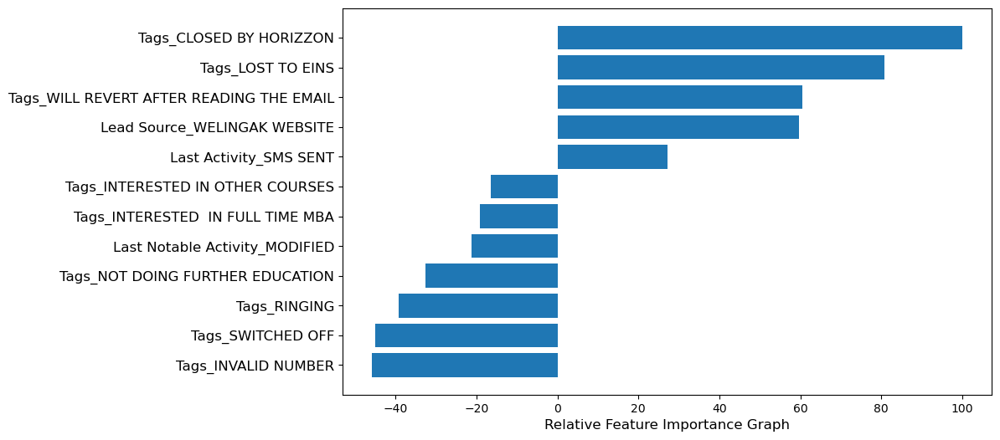

In [252]:

# To plot features with their relative importance
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(1, 1, 1)
pos = np.arange(sorted_idx.shape[0])
ax.barh(pos, feature_importance[sorted_idx])
ax.set_yticks(pos)
ax.set_yticklabels(np.array(X_train_New.columns)[sorted_idx], fontsize=12)
ax.set_xlabel('Relative Feature Importance Graph', fontsize=12) 
plt.show()

### Conclusion:
After trying out 4 models, our final model has following characteristics:

- All features p-values are less than the threshold of 0.05. Which is modelwise suggestable.
- VIFs for all features are very low. Hence, we can confirm that there is hardly any multicollinearity exists.
- The overall testing accuracy of 92.20% at a probability threshold of 0.27, which is again modelwise suggestable overall accuracy.
- The AUC (Area Under Curve) retained as almost 95.81%.
<br>
Final Observation: <br>
<br>
Accuracy : 92.20    <br>
Sensitivity / Recall:  88.03    <br>
Specificity:  94.93   <br>
False Positive Rate:  0.05     <br>
Positive Predictive Value:  0.918     <br>
Negative Predictive Value:  0.923    <br>

<br> ================================================ <br>
#### Let's now compare the values obtained for Train &  Test: <br>

Train Data: <br>
Accuracy : 92.22%   <br>
Sensitivity : 86.61.70%   <br>
Specificity : 95.67%   <br>


<br>
Test Data: <br>
Accuracy : 92.78% <br>
Sensitivity : 88.03% <br>
Specificity : 94.93% <br>
<br>

 with the Sales representatives on which leads to concentrate more.
 which leads to concentrate more. which leads to concentrate more. which leads to concentrate more.which leads to concentrate more.
 which leads to concentrate more.hich leads to concentrate more.
ore.

#### The Lead Score is calculated based on the converted probabilities and based on these lead scores, 
#### the CEO can make decisions along with the Sales representatives on which leads to concentrate more.